# Visualise data

Process and explore data for meta-analysis

In [1]:
### autoreload
%reload_ext autoreload
%autoreload 2

# custom
from calcification.analysis import analysis, analysis_utils
from calcification.utils import config
from calcification.plotting import analysis as analysis_plot
from calcification.plotting import locations as locations_plot
from calcification.plotting import interactive as interactive_plot
from calcification.plotting import (
    plot_utils,
    climatology,
    plot_config,
    data_exploration,
)
from calcification.processing import (
    climatology as climatology_processing,
    process,
)

# within-notebook plotting
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.express as px
from matplotlib.cm import get_cmap
from matplotlib.colors import to_hex
from matplotlib.patches import Patch
from matplotlib.colors import LinearSegmentedColormap
from cartopy import crs as ccrs
from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# plot standardised calcification against temperature
import numpy as np

In [2]:
# load extracted data (with effect sizes)
data_df, cg_df = process.process_extracted_calcification_data(
    fp=config.data_dir / "Orlando_data.xlsx",
)

local_climatology_df, global_future_anomaly_df, global_anomaly_df = (
    process.process_climatology_data(
        data_df,
        config.climatology_data_dir
        / "ph_scenarios_output_table_site_locations_mod.csv",
        config.climatology_data_dir
        / "sst_scenarios_output_table_site_locations_mod.csv",
        config.resources_dir / "locations.yaml",
    )
)


/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/processing/cleaning.py:86: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  return df.replace(" ", np.nan)
INFO:calcification.processing.locations:Using cached locations in /Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/resources/gmaps_locations.yaml
INFO:calcification.processing.taxonomy:Using species mapping in /Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/resources/species_mapping.yaml
INFO:calcification.processing.cleaning:Unit standardization complete: 3232/3232 rows converted successfully
INFO:calcification.process

Calculating carbonate chemistry:   0%|          | 0/3375 [00:00<?, ?it/s]

INFO:calcification.processing.carbonate_processing:Filled 8583.0 NaN values by combining dataframes


Assigning treatment groups:   0%|          | 0/329 [00:00<?, ?it/s]

INFO:root:Aggregating treatments with individual samples...


  0%|          | 0/144 [00:00<?, ?it/s]

control_df is empty for doi 10.1007/s00338-019-01775-y
losing 4 rows
control_df is empty for doi 10.1007/s00338-019-01775-y
losing 4 rows


/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/analysis/analysis.py:354: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace(0, mean_value).infer_objects(copy=False)
INFO:root:Loading climatology data...
/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/processing/climatology.py:19: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace(
/Users/rt582/Library/C

Generating batched anomalies for ph:   0%|          | 0/133 [00:00<?, ?it/s]

Generating batched anomalies for sst:   0%|          | 0/133 [00:00<?, ?it/s]

In [4]:
from calcification.analysis import meta_regression

result = meta_regression.DredgeAnalysis(
    df=data_df,
).run_parallel()


INFO:calcification.analysis.meta_regression:Running parallel dredge analysis with formula: st_relative_calcification ~ phtot + temp + delta_ph + delta_t + I(delta_t^2) + factor(core_grouping) - 1
INFO:calcification.analysis.meta_regression:Using 16 cores for parallel processing
/Users/rt582/miniforge3/envs/calcer/lib/python3.13/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "duration". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we have <class 'float'> and <class 'str'>). If happening with a pandas DataFrame the method infer_objects() will normalize data types before conversion.
  warnings.warn('Error while trying to convert '
/Users/rt582/miniforge3/envs/calcer/lib/python3.13/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "notes++". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we h


Removed 9 outlier(s) (from 804 samples) based on Cook's distance threshold of 0.19

----- PROCESSING SUMMARY -----
Treatment:  ['temp', 'phtot', 'phtot_temp_mv']
Total samples in input data:  1071
Total samples of relevant investigation:  867
Dropped due to NaN values in required columns: 63
Dropped due to Cook's distance: 9
Final sample count: 795 (267 rows dropped)






INFO:calcification.analysis.meta_regression:Parallel dredge analysis completed successfully. Found 64 model combinations.


In [12]:
# round to 2 decimal places
result.round(2).head(15).to_clipboard(index=False)


/Users/rt582/miniforge3/envs/calcer/lib/python3.13/site-packages/pandas/core/internals/blocks.py:1920: RuntimeWarning: invalid value encountered in multiply
  values = self.values.round(decimals)  # type: ignore[union-attr]


In [982]:
from calcification.analysis import analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm


def plot_effect_size(df, effect_type: str):
    _, ax = plt.subplots(figsize=(10, 5))
    ax.errorbar(
        df["temp"],
        df["calcs"],
        yerr=df["sds"],
        color="red",
        label="Calcification",
        fmt="o",
    )
    ax2 = ax.twinx()
    ax2.errorbar(
        df["temp"],
        df[f"{effect_type}"],
        yerr=np.sqrt(df[f"{effect_type}_var"]),
        color="green",
        label=effect_type,
        fmt="x",
    )

    # format
    ax.set_xlabel("Temperature")
    ax.set_ylabel("Calcification")
    ax2.set_ylabel("Effect size")
    ax.legend(
        handles=[ax.lines[0], ax2.lines[0]], labels=["Calcification", effect_type]
    )


def calc_effects(
    nsamples: int = 10,
    nreplicates: int = 3,
    calcs: list[float] = None,
    sds: list[float] = None,
    sd_loc: float = 1,
    sd_scale: float = 0.5,
):
    temp = np.linspace(25, 30, nsamples)
    calcs = np.linspace(10, 1, nsamples) if calcs is None else calcs
    sds = abs(np.random.normal(sd_loc, sd_scale, nsamples)) if sds is None else sds
    df = pd.DataFrame({"temp": temp, "calcs": calcs, "sds": sds})
    # get control values
    control_calc = df["calcs"].loc[df["temp"] == df["temp"].min()].values[0]
    control_temp = df["temp"].loc[df["calcs"] == control_calc].values[0]
    control_sd = df["sds"].loc[df["temp"] == control_temp].values[0]
    # calculate effect sizes
    effect_size_funcs = {
        "cohens_d": analysis.calc_cohens_d,
        "hedges_g": analysis.calc_hedges_g,
        "relative_rate": analysis.calc_relative_rate,
        "absolute_rate": analysis.calc_absolute_rate,
        # Add more effect size functions here as needed
    }
    for name, func in effect_size_funcs.items():
        df[[name, f"{name}_var"]] = df.apply(
            lambda x: pd.Series(
                func(
                    control_calc,
                    x["calcs"],
                    x["sds"],
                    control_sd,
                    nreplicates,
                    nreplicates,
                )
            ),
            axis=1,
        )
    return df


In [905]:
effect_df


,hedges_g_mean,cohens_d_mean,relative_rate_mean,hedges_g_sd,cohens_d_sd,relative_rate_sd
0,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1,0.019471,0.024339,100.0,0.017554,0.021942,0.0
2,0.036429,0.045536,100.0,0.027363,0.034204,0.0
3,0.057139,0.071424,100.0,0.035333,0.044166,0.0
4,0.105218,0.131522,100.0,0.187850,0.234812,0.0
...,...,...,...,...,...,...
95,0.074402,0.093002,100.0,0.075611,0.094513,0.0
96,0.055846,0.069808,100.0,0.048875,0.061094,0.0
97,0.040179,0.050224,100.0,0.033333,0.041666,0.0
98,0.022695,0.028369,100.0,0.024553,0.030691,0.0


In [942]:
df

,temp,calcs,sds,cohens_d,cohens_d_var,hedges_g,hedges_g_var,relative_rate,relative_rate_var,absolute_rate,absolute_rate_var
0,25.000000,1.000000,15.741905,0.000000,0.666667,0.000000,0.426667,0.000000,1.652050e+06,0.000000,165.205044
1,25.050505,4.639733,0.400122,0.326879,0.675571,0.261503,0.432365,363.973344,8.375133e+05,3.639733,82.655888
2,25.101010,8.211995,10.329073,0.541706,0.691120,0.433365,0.442317,721.199500,2.480877e+07,7.211995,118.165773
3,25.151515,11.716785,0.062976,0.962762,0.743909,0.770209,0.476102,1071.678467,8.278401e+05,10.716785,82.603844
4,25.202020,15.154102,0.093002,1.271547,0.801403,1.017238,0.512898,1415.410246,8.326462e+05,14.154102,82.605405
...,...,...,...,...,...,...,...,...,...,...,...
95,29.797980,15.154102,1.271063,1.267444,0.800535,1.013956,0.512342,1415.410246,2.062751e+06,14.154102,83.141055
96,29.848485,11.716785,4.162032,0.930786,0.738864,0.744629,0.472873,1071.678467,8.752983e+06,10.716785,88.376693
97,29.898990,8.211995,8.439945,0.571015,0.693838,0.456812,0.444056,721.199500,1.683838e+07,7.211995,106.346745
98,29.949495,4.639733,3.752378,0.318073,0.675098,0.254458,0.432062,363.973344,1.836389e+06,3.639733,87.295968


Generating samples:   0%|          | 0/100 [00:00<?, ?it/s]

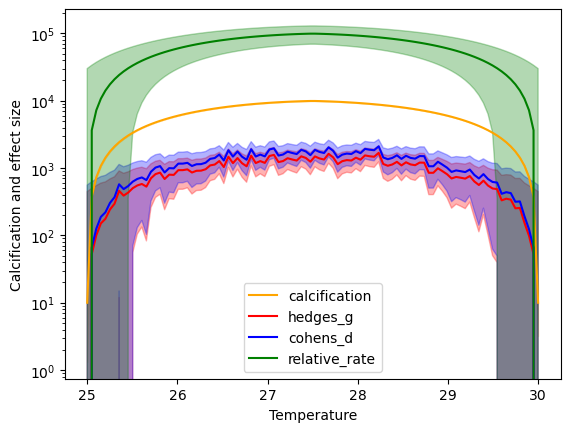

In [ ]:
num_trials = 100
num_samples = 100
effect_types = ["hedges_g", "cohens_d", "relative_rate"]

# For each effect type, collect a list of arrays (one per trial)
effect_data = {effect_type: [] for effect_type in effect_types}


min_calc = 10
max_calc = 100
sd_loc = 1
sd_scale = 10
calcs = (
    min_calc
    + max_calc**2
    - np.concatenate(
        [
            np.linspace(max_calc, min_calc, int(num_samples / 2)) ** 2,
            np.linspace(min_calc, max_calc, int(num_samples / 2)) ** 2,
        ]
    )
)


for trial in tqdm(range(num_trials), desc="Generating samples"):
    df = calc_effects(
        num_samples, nreplicates=3, sd_loc=sd_loc, sd_scale=sd_scale, calcs=calcs
    )
    for effect_type in effect_types:
        effect_data[effect_type].append(df[effect_type].values)

# Now, for each effect type, stack the arrays into a 2D numpy array: shape (num_trials, num_samples)
effect_arrays = {
    effect_type: np.stack(effect_data[effect_type], axis=0)
    for effect_type in effect_types
}

# For each effect type, compute the mean and std at each sample point (across trials)
mean_effect_sizes = {
    effect_type: arr.mean(axis=0) for effect_type, arr in effect_arrays.items()
}
sd_effect_sizes = {
    effect_type: arr.std(axis=0) for effect_type, arr in effect_arrays.items()
}

# Optionally, put these into a DataFrame for easy inspection
effect_df = pd.DataFrame(
    {
        f"{effect_type}_mean": mean_effect_sizes[effect_type]
        for effect_type in effect_types
    }
)
for effect_type in effect_types:
    effect_df[f"{effect_type}_sd"] = sd_effect_sizes[effect_type]

# plot calcification with +-1 sd bands for mean and sd of each effect type
fig, ax = plt.subplots()
ax.plot(df["temp"], df["calcs"], label="calcification", c="orange")
ax.fill_between(
    df["temp"],
    df["calcs"] - df["sds"],
    df["calcs"] + df["sds"],
    alpha=0.2,
    color="orange",
)
# plot mean and sd of each effect type
colors = ["red", "blue", "green"]
# ax2 = ax.twinx()
for effect_type in effect_types:
    # if effect_type == "relative_rate":
    #     a = ax2
    # else:
    #     a = ax
    ax.plot(
        df["temp"],
        effect_df[f"{effect_type}_mean"],
        label=effect_type,
        c=colors[effect_types.index(effect_type)],
    )
    ax.fill_between(
        df["temp"],
        effect_df[f"{effect_type}_mean"] - effect_df[f"{effect_type}_mean"].std(),
        effect_df[f"{effect_type}_mean"] + effect_df[f"{effect_type}_mean"].std(),
        alpha=0.3,
        # label=effect_type,
        color=colors[effect_types.index(effect_type)],
    )
plt.legend()
plt.yscale("log")
plt.xlabel("Temperature")
plt.ylabel("Calcification and effect size");

In [ ]:
min_calc = 10
max_calc = 100
num_samples = 100
max_calc**2 - np.concatenate(
    [
        np.linspace(max_calc, min_calc, int(num_samples / 2)) ** 2,
        np.linspace(min_calc, max_calc, int(num_samples / 2)) ** 2,
    ]
)

array([   0.        ,  363.97334444,  721.19950021, 1071.67846731,
       1415.41024573, 1752.39483549, 2082.63223657, 2406.12244898,
       2722.86547272, 3032.86130779, 3336.10995419, 3632.61141191,
       3922.36568097, 4205.37276135, 4481.63265306, 4751.1453561 ,
       5013.91087047, 5269.92919617, 5519.20033319, 5761.72428155,
       5997.50104123, 6226.53061224, 6448.81299459, 6664.34818825,
       6873.13619325, 7075.17700958, 7270.47063723, 7459.01707622,
       7640.81632653, 7815.86838817, 7984.17326114, 8145.73094544,
       8300.54144107, 8448.60474802, 8589.92086631, 8724.48979592,
       8852.31153686, 8973.38608913, 9087.71345273, 9195.29362766,
       9296.12661391, 9390.2124115 , 9477.55102041, 9558.14244065,
       9631.98667222, 9699.08371512, 9759.43356935, 9813.0362349 ,
       9859.89171179, 9900.        , 9900.        , 9859.89171179,
       9813.0362349 , 9759.43356935, 9699.08371512, 9631.98667222,
       9558.14244065, 9477.55102041, 9390.2124115 , 9296.12661

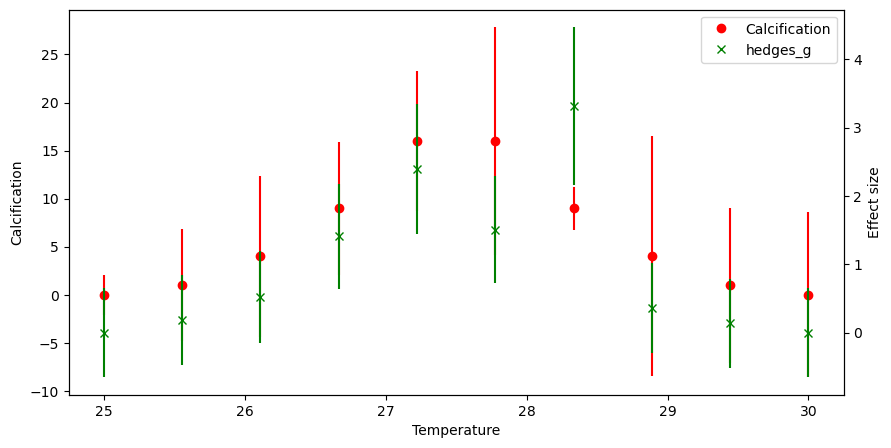

In [ ]:
min_calc = 0
max_calc = 4
nsamples = 10
df = calc_effects(
    nsamples,
    nreplicates,
    calcs=np.concat(
        [
            np.linspace(min_calc, max_calc, int(nsamples / 2)) ** 2,
            np.linspace(max_calc, min_calc, int(nsamples / 2)) ** 2,
        ]
    ),
    sd_loc=1,
    sd_scale=10,
)
plot_effect_size(df, "hedges_g")
# plot_effect_size(df, "relative_rate")


In [818]:
df["control_calcification"] = df[df["temp"] == df["temp"].min()]["calcs"].iloc[0]
df["control_calcification_sd"] = df[df["temp"] == df["temp"].min()]["sds"].iloc[0]
df

,temp,calcs,sds,cohens_d,cohens_d_var,hedges_g,hedges_g_var,relative_rate,relative_rate_var,absolute_rate,absolute_rate_var,control_calcification,control_calcification_sd
0,25.000000,9.0000,1.101895,0.000000,0.200000,0.000000,0.183456,0.000000,29.979567,0.0000,0.242834,9.0,1.101895
1,25.555556,10.5625,9.052686,0.242306,0.201468,0.232068,0.184802,17.361111,1408.526209,1.5625,8.316530,9.0,1.101895
2,26.111111,12.2500,1.428990,2.547087,0.362191,2.439464,0.332230,36.111111,61.694478,3.2500,0.325618,9.0,1.101895
3,26.666667,14.0625,5.027069,1.391154,0.248383,1.332373,0.227836,56.250000,776.691146,5.0625,2.648560,9.0,1.101895
4,27.222222,16.0000,10.942961,0.900093,0.220254,0.862061,0.202034,77.777778,4687.385710,7.0000,12.096257,9.0,1.101895
5,27.777778,16.0000,2.948830,3.144715,0.447231,3.011839,0.410235,77.777778,354.278488,7.0000,0.990977,9.0,1.101895
6,28.333333,14.0625,5.817104,1.209256,0.236558,1.158161,0.216989,56.250000,1034.915779,5.0625,3.505287,9.0,1.101895
7,28.888889,12.2500,3.106836,1.394285,0.248601,1.335371,0.228036,36.111111,235.759132,3.2500,1.086660,9.0,1.101895
8,29.444444,10.5625,14.156033,0.155626,0.200605,0.149050,0.184011,17.361111,3422.573691,1.5625,20.160745,9.0,1.101895
9,30.000000,9.0000,1.426096,0.000000,0.200000,0.000000,0.183456,0.000000,40.097804,0.0000,0.324792,9.0,1.101895


In [816]:
# TODO: can I visualise the aggregate effect of these changes?
from calcification.analysis import effect_type_reliability_analysis

effect_type_reliability_analysis.quick_reliability_check(df)

,effect_type,correlation,r_squared,mae,rmse,sample_size,mean_effect,std_effect,min_effect,max_effect
2,relative_rate,1.000000,1.000000,34.125000,42.329901,10,37.500000,29.011935,0.0,77.777778
0,hedges_g,0.701193,0.491671,2.322961,3.013770,10,1.052039,1.036731,0.0,3.011839
1,cohens_d,0.701193,0.491671,2.276548,2.967462,10,1.098452,1.082469,0.0,3.144715


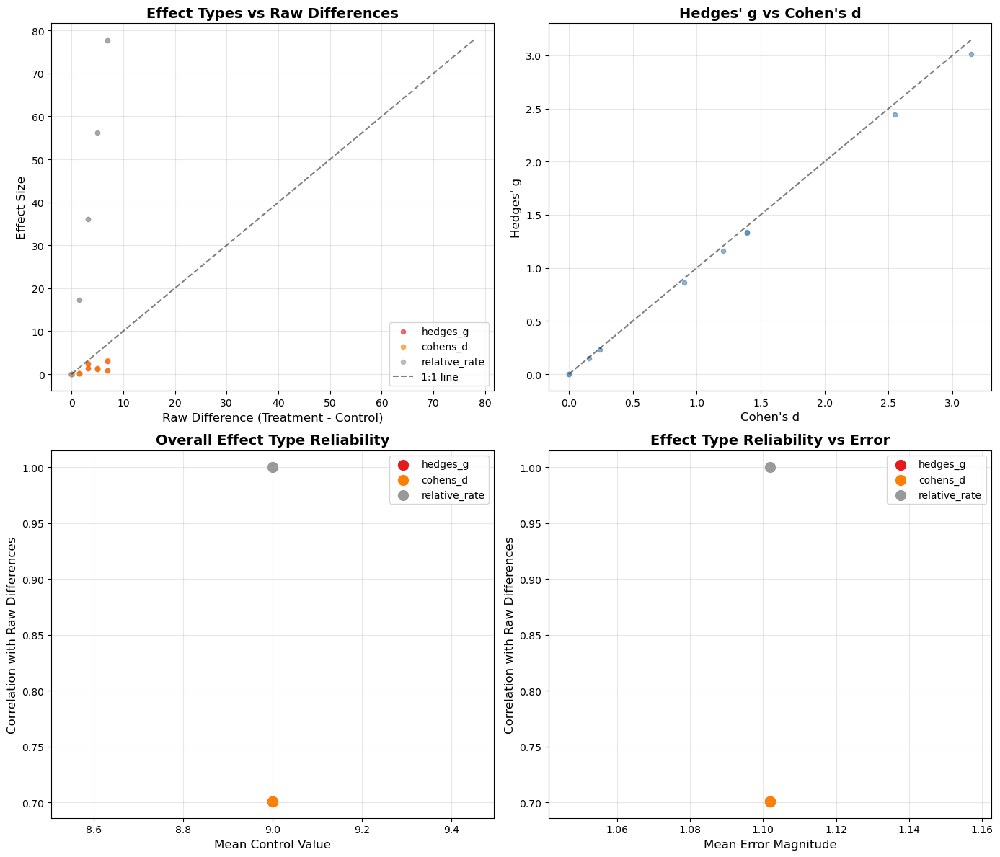

In [820]:
effect_type_reliability_analysis.plot_effect_type_comparison(df);

In [ ]:
# Wednesday, Friday, or any morning except Friday


In [632]:
# load extracted data (with effect sizes)
data_df, tg_df = process.process_extracted_calcification_data(
    fp=config.data_dir / "Orlando_data.xlsx",
)
local_climatology_df, global_future_anomaly_df, global_anomaly_df = (
    process.process_climatology_data(
        data_df,
        config.climatology_data_dir
        / "ph_scenarios_output_table_site_locations_mod.csv",
        config.climatology_data_dir
        / "sst_scenarios_output_table_site_locations_mod.csv",
        config.resources_dir / "locations.yaml",
    )
)

### calculate delta_t_clim and delta_ph_clim (mean_historical_sst_30y_ensemble and mean_historical_ph_30y_ensemble minus the phtot and temp columns)
local_climatology_df["delta_t_clim"] = (
    local_climatology_df["temp"]
    - local_climatology_df["mean_historical_sst_30y_ensemble"]
)
local_climatology_df["delta_ph_clim"] = (
    local_climatology_df["phtot"]
    - local_climatology_df["mean_historical_ph_30y_ensemble"]
)


/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/processing/cleaning.py:86: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

INFO:calcification.processing.locations:Using cached locations in /Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/resources/gmaps_locations.yaml
INFO:calcification.processing.taxonomy:Using species mapping in /Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/resources/species_mapping.yaml
INFO:calcification.processing.carbonate_processing:Loading measured values...


Calculating carbonate chemistry:   0%|          | 0/3393 [00:00<?, ?it/s]

INFO:calcification.processing.carbonate_processing:Filled 8578.0 NaN values by combining dataframes


Assigning treatment groups:   0%|          | 0/327 [00:00<?, ?it/s]

INFO:root:Aggregating treatments with individual samples...


  0%|          | 0/144 [00:00<?, ?it/s]

control_df is empty for doi 10.1007/s00338-019-01775-y
losing 4 rows
control_df is empty for doi 10.1007/s00338-019-01775-y
losing 4 rows


/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/analysis/analysis.py:353: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

INFO:root:Loading climatology data...
/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/processing/climatology.py:19: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rate

Generating batched anomalies for ph:   0%|          | 0/133 [00:00<?, ?it/s]

Generating batched anomalies for sst:   0%|          | 0/133 [00:00<?, ?it/s]

## Treatment group assignment

In [299]:
def select_study_treatment_dois(
    tg_df: pd.DataFrame,
    treatment_type: str = "t",
    clustering_var: str = "doi",
    verbose: bool = False,
) -> pd.DataFrame:
    """
    Select a study from the treatment group dataframe based on the treatment level t or ph.
    Prints debug info to help understand why studies may not match.
    """
    alt_treatment = "t" if treatment_type == "ph" else "ph"

    def group_filter(x, verbose=False):
        # Debug: print unique values for both treatment levels
        if verbose:
            print(
                f"Group {x[clustering_var].iloc[0]}: "
                f"{f'treatment_level_{alt_treatment}'} unique: {x[f'treatment_level_{alt_treatment}'].unique()}, "
                f"all zero: {(x[f'treatment_level_{alt_treatment}'] == 0).all()}, "
                f"{f'treatment_level_{treatment_type}'} nunique: {x[f'treatment_level_{treatment_type}'].nunique()}"
                f"\nPASSED: {((x[f'treatment_level_{alt_treatment}'] == 0).all() and x[f'treatment_level_{treatment_type}'].nunique() > 1)}"
            )
        return (x[f"treatment_level_{alt_treatment}"] == 0).all() and x[
            f"treatment_level_{treatment_type}"
        ].nunique() > 1

    study_cluster = (
        tg_df.groupby(clustering_var)
        .filter(group_filter)[clustering_var]
        .drop_duplicates()
    )
    print(f"{len(study_cluster)} studies match the criteria.")
    return study_cluster

80 studies match the criteria.


/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_73118/3488022905.py:18: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



No local climatology data found for 10.1038/s43247-024-01672-5-LOC-B
No local climatology data found for 10.1093/icesjms/fsv162


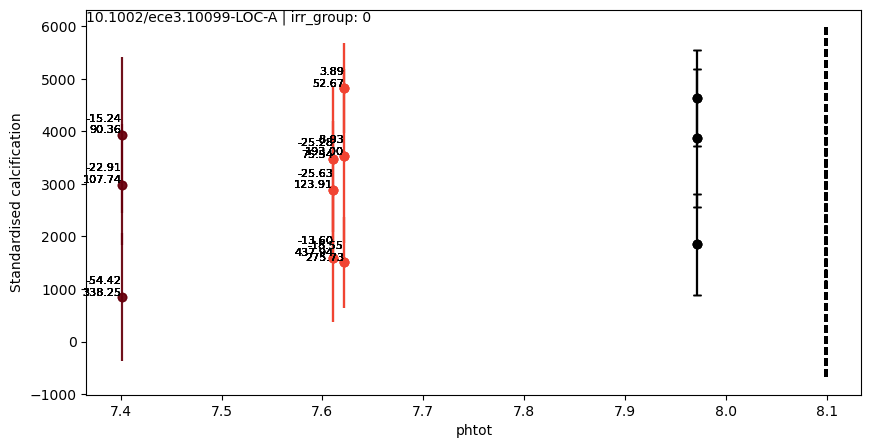

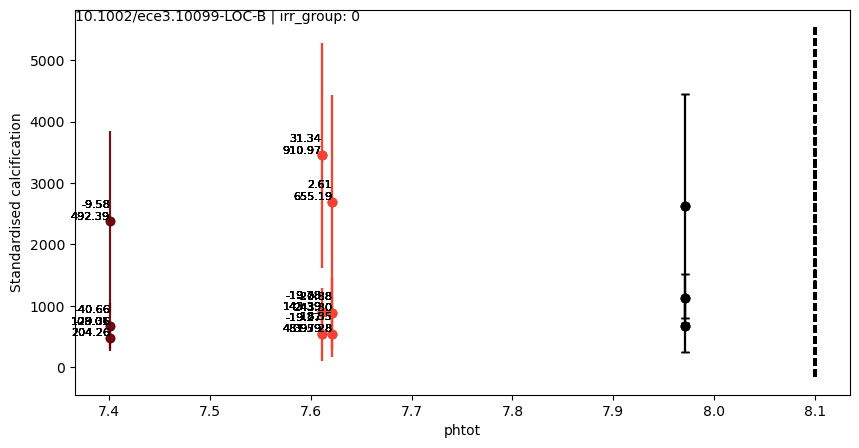

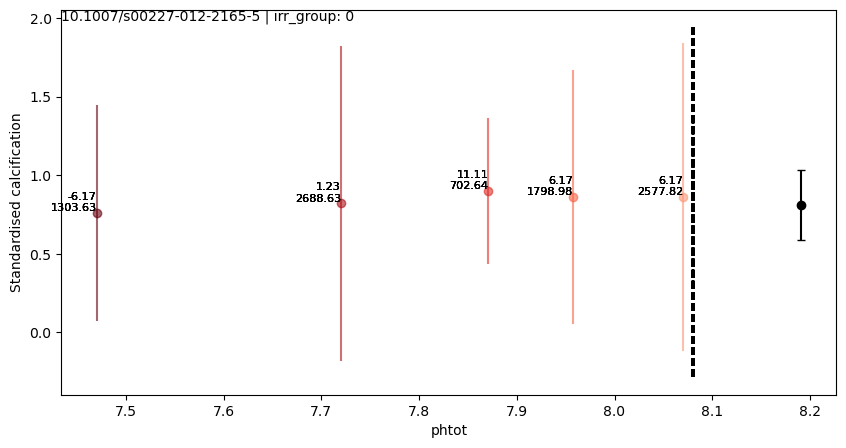

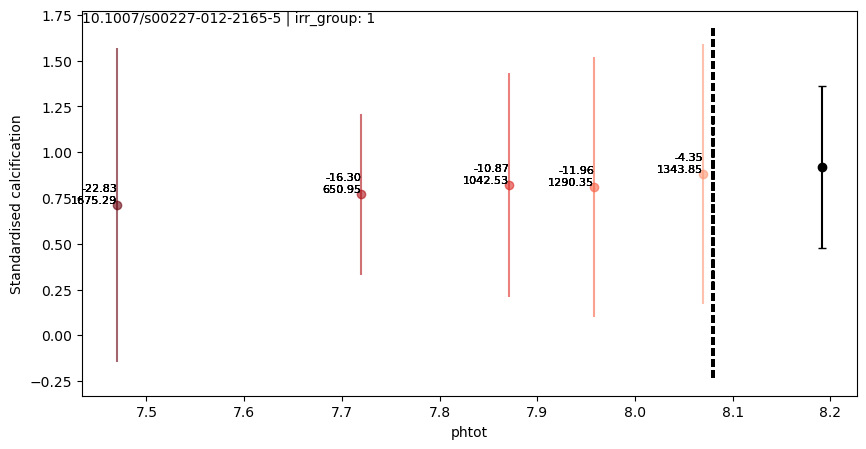

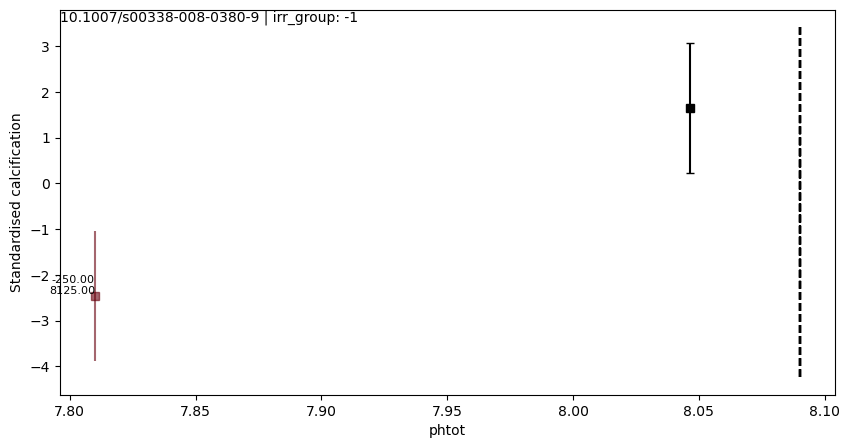

...

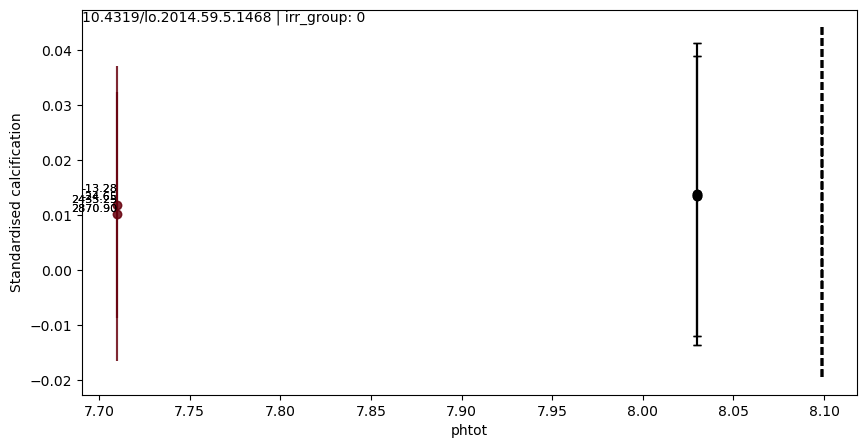

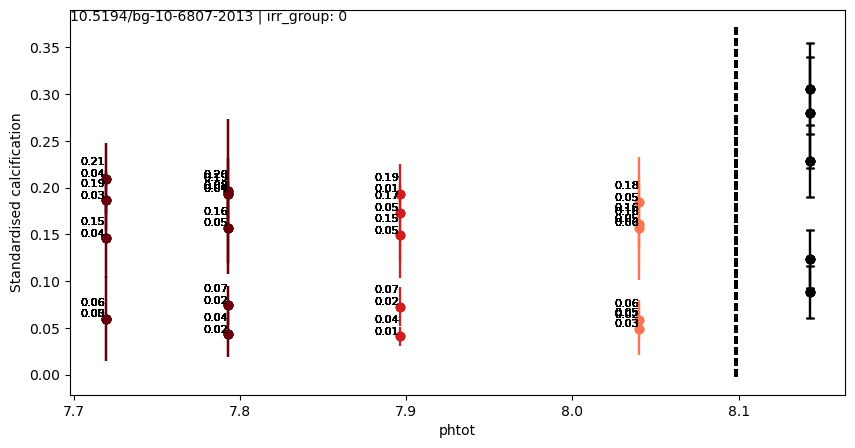

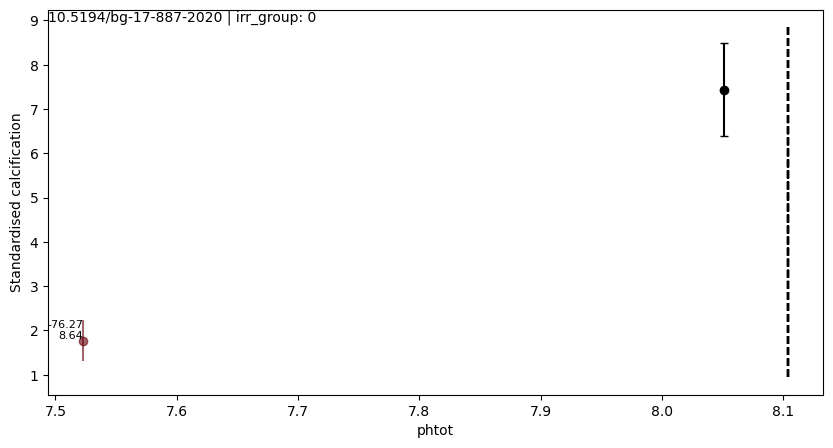

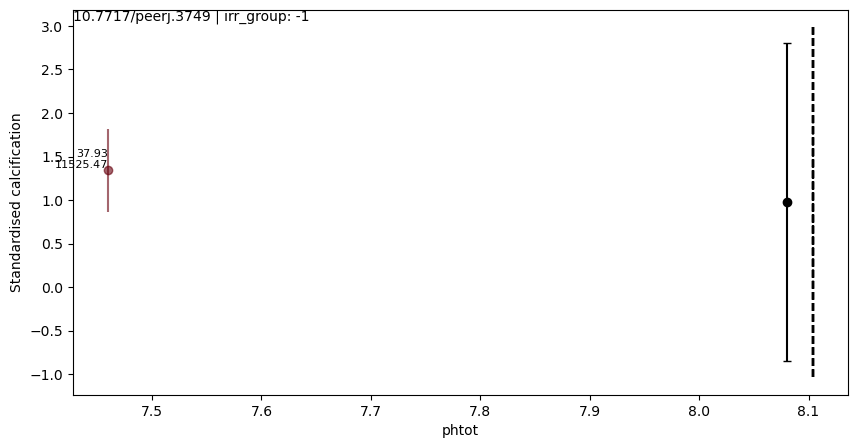

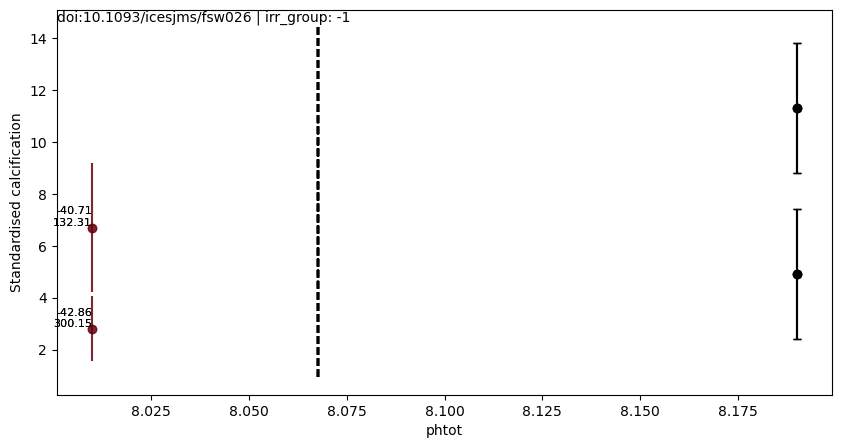

In [958]:
def plot_study_treatment_levels(
    study_df: pd.DataFrame,
    study_effect_df: pd.DataFrame,
    treatment_type: str = "t",
    effect_type: str = "st_relative_calcification",
) -> None:
    """
    Plot the treatment levels of a study.
    """
    # sort by treatment level
    study_df = study_df.sort_values(by=f"treatment_level_{treatment_type}")
    if study_df.empty:
        return
    treatment_levels = study_df[f"treatment_level_{treatment_type}"].unique()
    colors = plt.cm.Reds(np.linspace(0.2, 1, len(treatment_levels)))
    color_map = dict(zip(treatment_levels, colors))
    treatment = "temp" if treatment_type == "t" else "phtot"
    plt.figure(figsize=(10, 5))
    core_grouping_markers = {
        "Coral": "o",
        "CCA": "s",
        "Other algae": "^",
        "Halimeda": "D",
        "Foraminifera": "v",
    }

    for tl in treatment_levels:
        mask = study_df[f"treatment_level_{treatment_type}"] == tl
        for cg in study_df.loc[mask, "core_grouping"]:
            # for irr_group in study_df.loc[mask, "irr_group"].unique():
            cg_df = study_df.loc[
                mask
                & (study_df["core_grouping"] == cg)
                & (study_df["irr_group"] == irr_group)
            ]
            if tl == 0:  # plot control point in black
                plt.errorbar(
                    cg_df.loc[mask, treatment],
                    cg_df.loc[mask, "st_calcification"],
                    yerr=cg_df.loc[mask, "st_calcification_sd"],
                    fmt=core_grouping_markers[cg],
                    color="k",  # set both marker and line to black
                    capsize=3,
                )
                continue

            plt.errorbar(
                cg_df.loc[mask, treatment],
                cg_df.loc[mask, "st_calcification"],
                yerr=cg_df.loc[mask, "st_calcification_sd"],
                fmt=core_grouping_markers[cg],
                color=color_map[tl],
                alpha=0.6,
            )

            # annotate each point with its effect size from study_effect_df
            for _, row in study_effect_df.iterrows():
                effect_size = row[effect_type]
                effect_var = row[f"{effect_type}_var"]
                plt.text(
                    row[treatment],
                    row["st_calcification"],
                    f"{effect_size:.2f}\n{effect_var:.2f}",
                    fontsize=8,
                    ha="right",
                    va="bottom",
                )

    clim_var = "ph" if treatment_type == "ph" else "sst"

    local_climatology = local_climatology_df[
        local_climatology_df.index.get_level_values("doi") == study_df.iloc[0]["doi"]
    ]
    if not local_climatology.empty:
        plt.vlines(
            x=local_climatology[f"mean_historical_{clim_var}_30y_ensemble"],
            ymin=plt.ylim()[0],
            ymax=plt.ylim()[1],
            color="black",
            linestyle="--",
        )  # plot historic local climatology line
    else:
        print(f"No local climatology data found for {study_df.iloc[0]['doi']}")
    # annotate the plot with the study doi
    plt.text(
        plt.xlim()[0],
        plt.ylim()[1],
        f"{study_df.iloc[0]['doi']} | irr_group: {study_df.iloc[0]['irr_group']}",
        ha="left",
        va="top",
        fontsize=10,
    )
    # plt.legend(title=f"treatment_level_{treatment_type}")
    plt.xlabel(treatment)
    plt.ylabel("Standardised calcification")


treatment_type = "ph"
study_dois = select_study_treatment_dois(
    tg_df, treatment_type=treatment_type, clustering_var="doi"
)
# order by study_doi
study_dois = study_dois.sort_values()
for doi in study_dois:
    # doi df
    doi_df = tg_df[tg_df.doi == doi]
    effect_df = data_df[data_df.doi == doi]
    if doi_df.doi.nunique() > 1:
        print(f"Multiple studies found for {doi}")
        continue
    # if multiple irr_group levels, plot each irr_group level separately
    # sort by irr_group
    doi_df = doi_df.sort_values(by="irr_group")
    effect_df = effect_df.sort_values(by="irr_group")
    irr_group_levels = effect_df.irr_group.unique()
    for irr_group in irr_group_levels:
        irr_group_df = doi_df[doi_df.irr_group == irr_group]
        irr_group_effect_df = effect_df[effect_df.irr_group == irr_group]
        plot_study_treatment_levels(
            irr_group_df, irr_group_effect_df, treatment_type=treatment_type
        )

## Study metadata

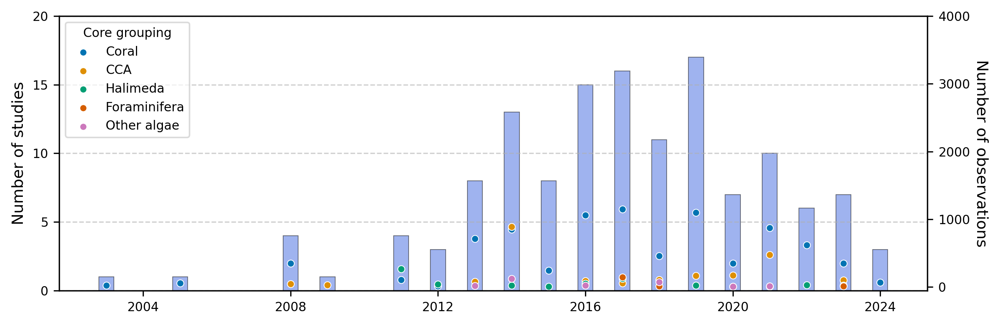

In [29]:
### plot temporal distribution of studies, broken down by species
data_exploration.plot_study_timeseries(data_df, colorby="core_grouping");

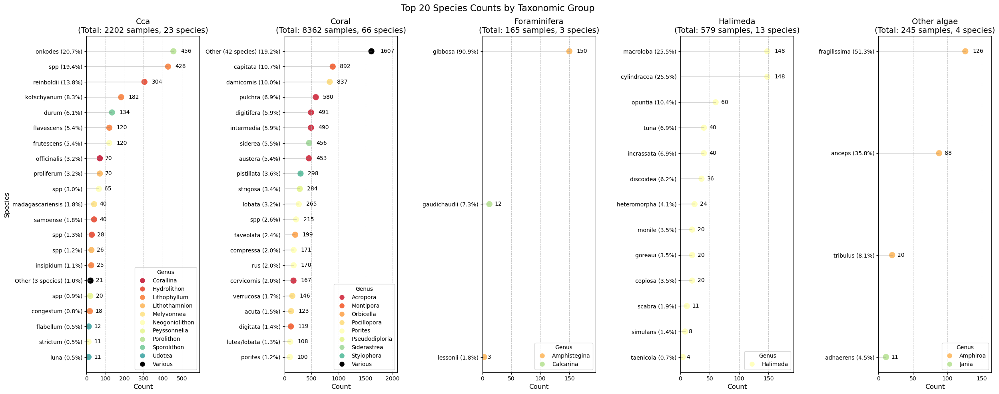

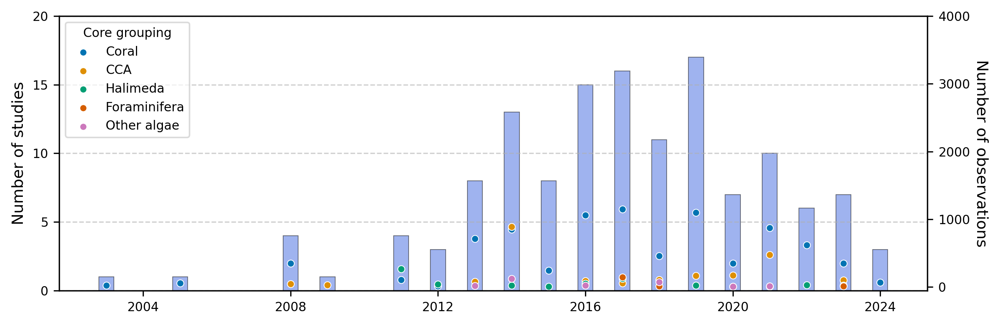

In [30]:
### plot taxonomic distribution of study organisms
data_exploration.create_faceted_dotplot_with_percentages(
    data_df, top_n=20, groupby="core_grouping"
)
### plot temporal distribution of studies, broken down by species
data_exploration.plot_study_timeseries(data_df, colorby="core_grouping");

## Units

### Occurences

Number of different calcification units: 79


(0.0, 198.00000000000003)

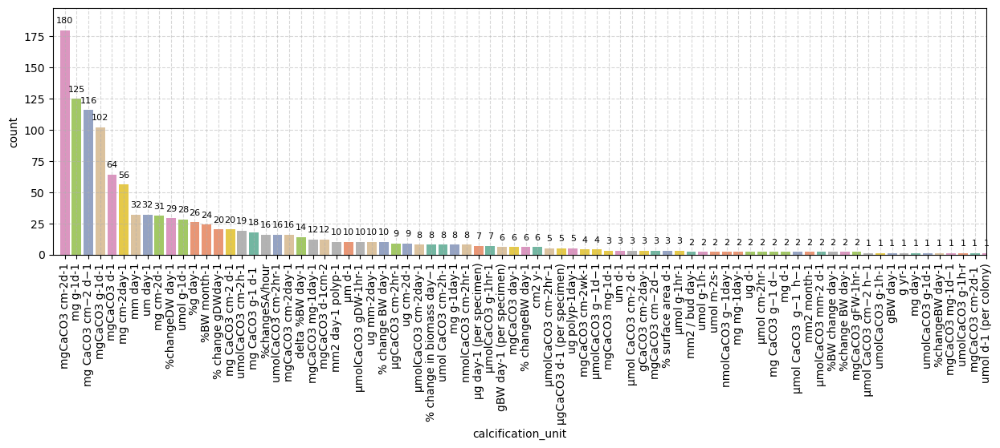

In [35]:
### visualising raw units
plt.figure(figsize=(15, 4))
count_order = (
    data_df["calcification_unit"].value_counts().index
)  # sort by number of counts for each calcification unit
sns.countplot(
    data=data_df,
    x="calcification_unit",
    order=count_order,
    palette="Set2",
    hue="calcification_unit",
)
plt.xticks(rotation=90)
plt.grid(ls="--", alpha=0.5)
for p in plt.gca().patches:
    plt.annotate(
        f"{int(p.get_height())}",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=8,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
print(
    f"Number of different calcification units: {len(data_df['calcification_unit'].unique())}"
)
# adjust limits of axes to fit in the data more neatly
plt.xlim(-1, len(data_df["calcification_unit"].unique()) - 1)
plt.ylim(0, data_df["calcification_unit"].value_counts().max() * 1.1)

Number of distinct types of calcification measurement: 7


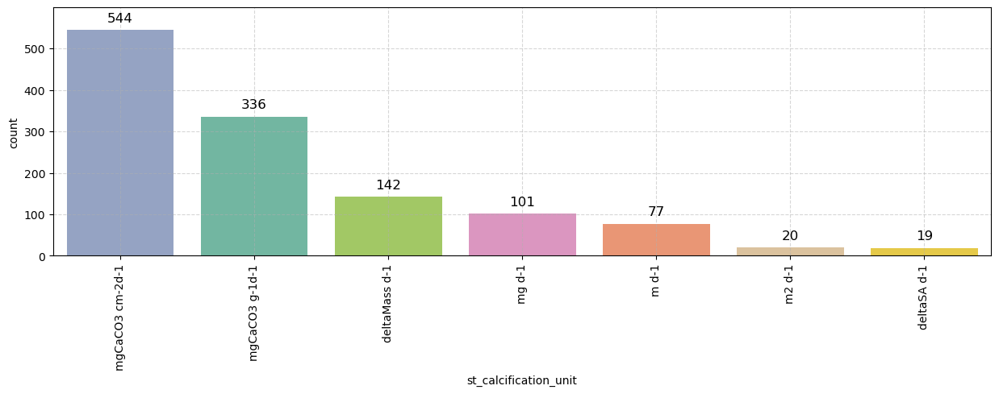

In [36]:
### visualising standardised units
plt.figure(figsize=(15, 4))
count_order = (
    data_df["st_calcification_unit"].value_counts().index
)  # sort by number of counts for each calcification unit
# plot
sns.countplot(
    data=data_df,
    x="st_calcification_unit",
    order=count_order,
    palette="Set2",
    hue="st_calcification_unit",
)
# format
plt.xticks(rotation=90)
plt.grid(ls="--", alpha=0.5)
for p in plt.gca().patches:
    plt.annotate(
        f"{int(p.get_height())}",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=12,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
plt.ylim(0, data_df["st_calcification_unit"].value_counts().max() * 1.1)
# report
print(
    f"Number of distinct types of calcification measurement: {len(data_df['st_calcification_unit'].unique())}"
)

Number of distinct types of calcification measurement: 7


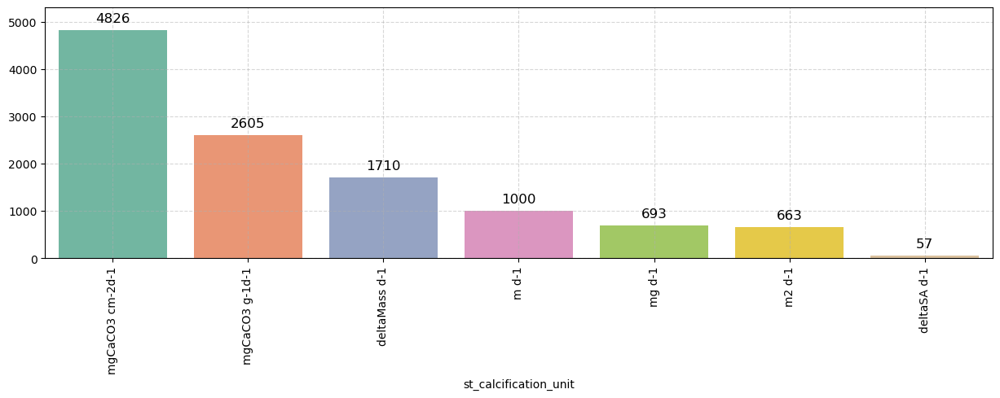

In [37]:
### visualising standardised units with total samples (n)
plt.figure(figsize=(15, 4))

unit_counts = (
    data_df.groupby("st_calcification_unit")["n"].sum().sort_values(ascending=False)
)  # group by 'st_calcification_unit' and sum the 'n' column
# plot
sns.barplot(
    x=unit_counts.index, y=unit_counts.values, palette="Set2", hue=unit_counts.index
)
# format
plt.xticks(rotation=90)
plt.grid(ls="--", alpha=0.5)
for i, value in enumerate(unit_counts.values):
    plt.annotate(
        f"{int(value)}",
        (i, value),
        ha="center",
        va="bottom",
        fontsize=12,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
plt.ylim(0, unit_counts.max() * 1.1)
# report
print(f"Number of distinct types of calcification measurement: {len(unit_counts)}")

### Distributions

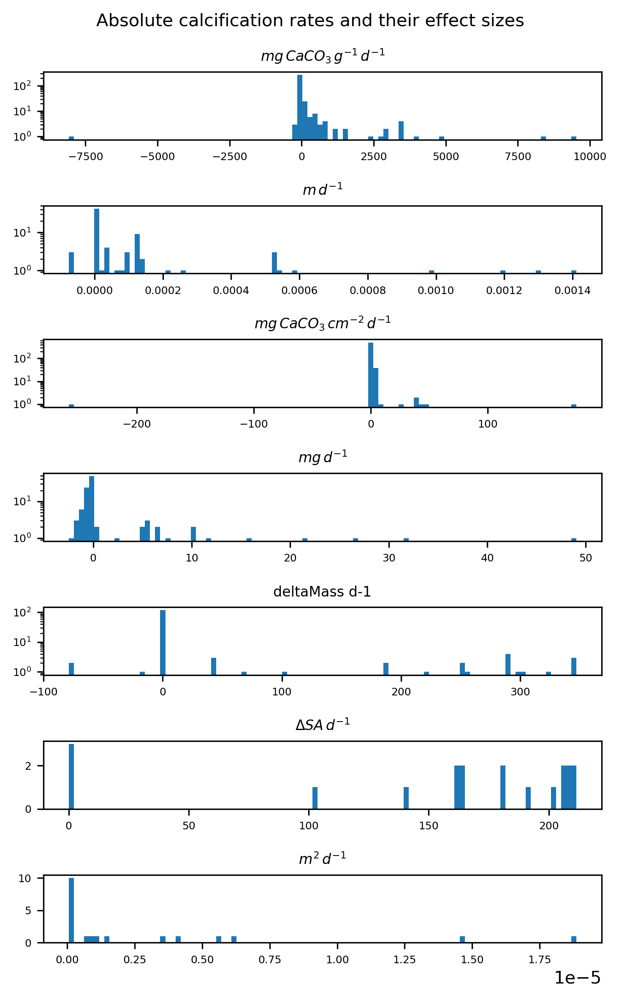

In [38]:
### visualise distributions of various calcification rates
rate_types = data_df["st_calcification_unit"].unique()
rate_types = [rate_type for rate_type in rate_types if rate_type != ""]
fig, axes = plt.subplots(len(rate_types), 1, figsize=(5, 8), dpi=300)

for i, rate_type in enumerate(rate_types):
    axes[i].hist(
        data_df[data_df["st_calcification_unit"] == rate_type]["st_calcification"],
        bins=100,
    )
    axes[i].set_title(
        f"{plot_config.RATE_TYPE_MAPPING.get(rate_type, rate_type)}", fontsize=8
    )

# format
for ax in axes.flatten():
    if max([p.get_height() for p in ax.patches]) > 10:
        ax.set_yscale("log")
    ax.tick_params(
        axis="both", which="major", labelsize=6
    )  # Adjust label size for both axes
plt.suptitle("Absolute calcification rates and their effect sizes", fontsize=10)
plt.tight_layout()

## Climatology

In [ ]:
local_climatology_df, global_future_anomaly_df, global_anomaly_df = (
    process.process_climatology_data(
        data_df,
        config.climatology_data_dir / "ph_scenarios_output_table_site_locations.csv",
        config.climatology_data_dir
        / "sst_scenarios_output_table_site_locations_plot.csv",
        config.resources_dir / "locations_plot.yaml",
    )
)


INFO:root:Loading climatology data...
/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/processing/climatology.py:19: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace(
/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/calc-rates/calcification/processing/climatology.py:19: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace(
INFO:root:Unique locations in climatology: 198, locations in working

Generating batched anomalies for ph:   0%|          | 0/76 [00:00<?, ?it/s]

Generating batched anomalies for sst:   0%|          | 0/76 [00:00<?, ?it/s]

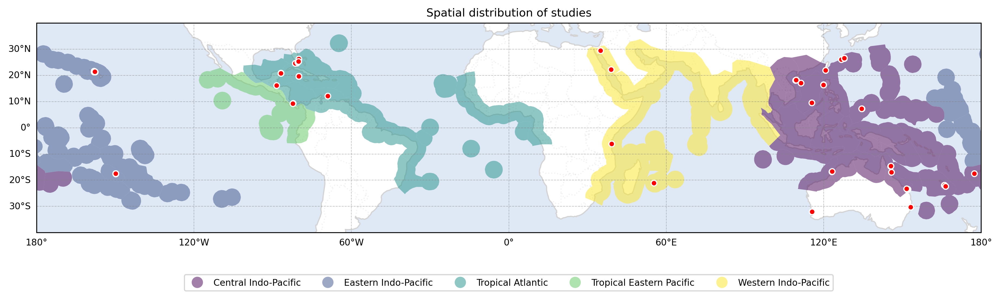

(<Figure size 4500x3000 with 1 Axes>,
 <GeoAxes: title={'center': 'Spatial distribution of studies'}>)

In [ ]:
### visualise study distribution
locations_plot.plot_areas_with_study_locations(
    data_df.drop_duplicates("doi", keep="first")
)

#### Visualising spatial trends in climatological variables for different warming scenarios

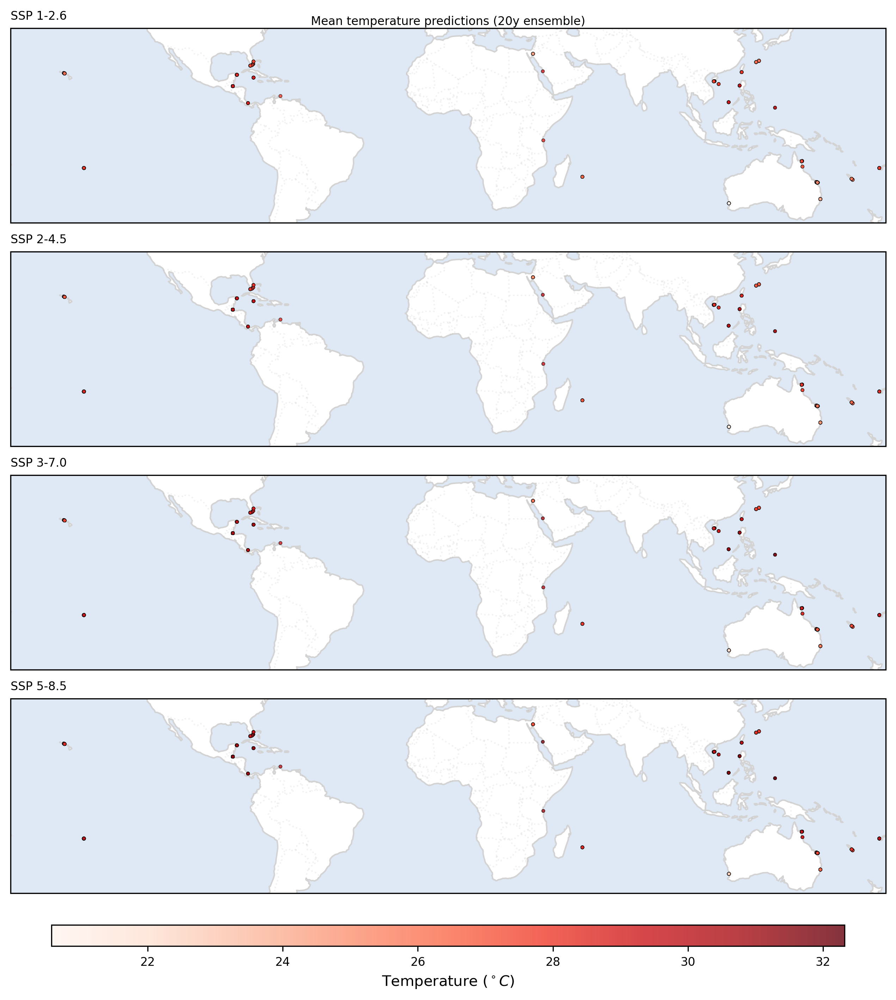

In [44]:
### visualise forecasted mean temperatures, by SSP
fig, axes = climatology.plot_spatial_effect_distribution(
    local_climatology_df.reset_index(),
    var_to_plot="mean_sst_20y_ensemble",
    title="Mean temperature predictions (20y ensemble)",
    cbar_label="Temperature ($^\\circ C$)",
    reverse_cmap=False,
)

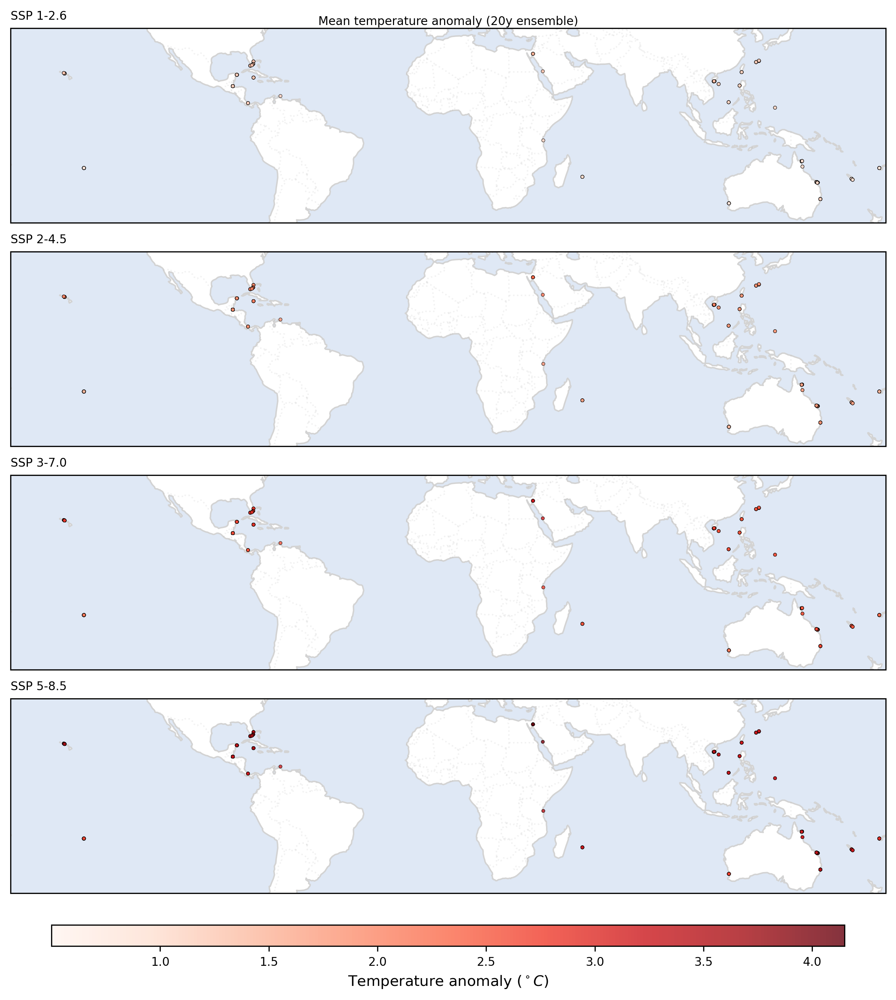

In [45]:
### visualise forecasted mean temperature anomalies, by SSP
fig, axes = climatology.plot_spatial_effect_distribution(
    local_climatology_df.reset_index(),
    var_to_plot="mean_sst_20y_anomaly_ensemble",
    title="Mean temperature anomaly (20y ensemble)",
    cbar_label="Temperature anomaly ($^\\circ C$)",
    reverse_cmap=False,
)

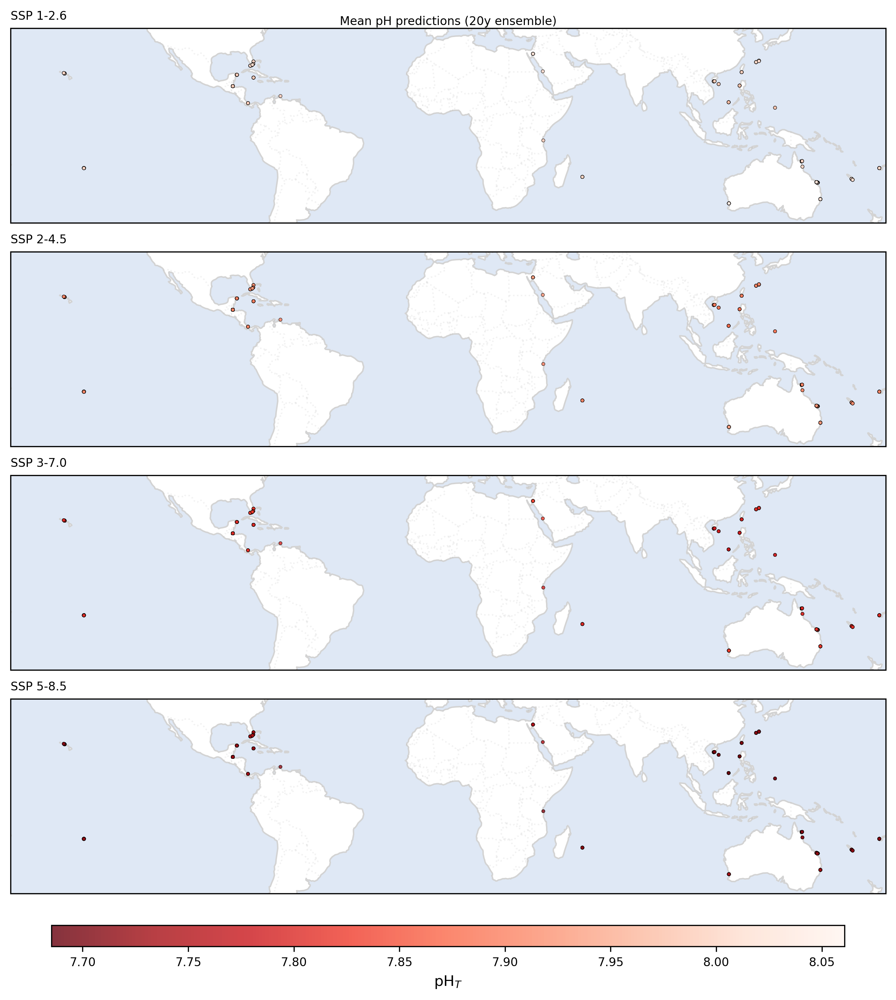

In [46]:
### visualise forecasted mean pH, by SSP
fig, axes = climatology.plot_spatial_effect_distribution(
    local_climatology_df.reset_index(),
    var_to_plot="mean_ph_20y_ensemble",
    title="Mean pH predictions (20y ensemble)",
    cbar_label="pH$_T$",
    reverse_cmap=True,
)

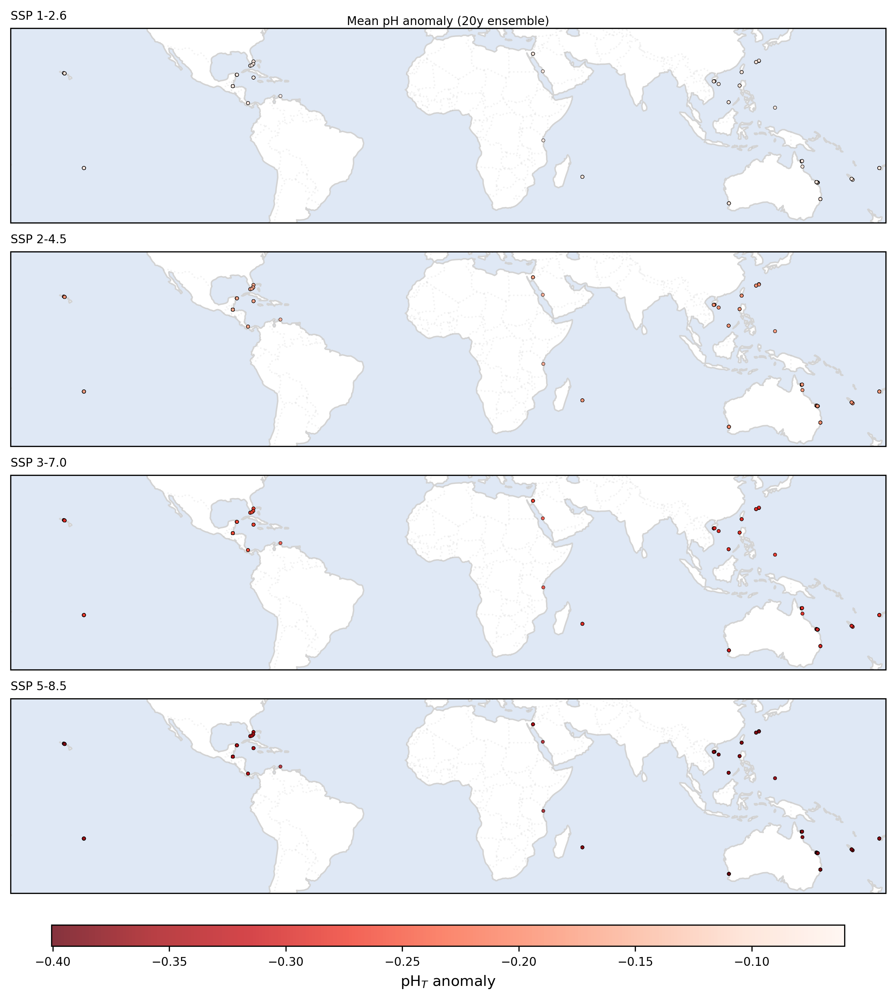

In [47]:
### visualise forecasted mean pH anomalies, by SSP
fig, axes = climatology.plot_spatial_effect_distribution(
    local_climatology_df.reset_index(),
    var_to_plot="mean_ph_20y_anomaly_ensemble",
    title="Mean pH anomaly (20y ensemble)",
    cbar_label="pH$_T$ anomaly",
    reverse_cmap=True,
)

## Variable-calcification visualisations

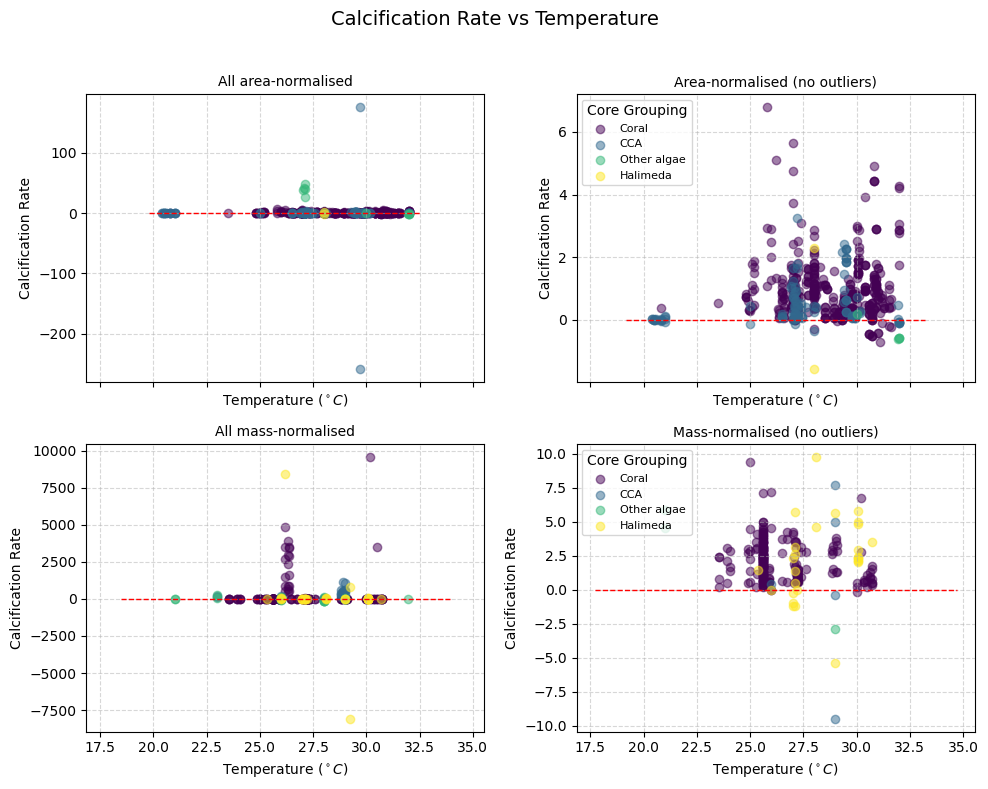

In [48]:
### naive plotting of calcification rates against absolute values of temperature
### for two main unit subsets (mgCaCO3 cm-2d-1 and mgCaCO3 g-1d-1)
area_norm_df = data_df[data_df["st_calcification_unit"] == "mgCaCO3 cm-2d-1"].copy()
mass_norm_df = data_df[data_df["st_calcification_unit"] == "mgCaCO3 g-1d-1"].copy()

# TODO: these currently assigned by sight due to large inherent variance
area_norm_no_outliers_df = area_norm_df[
    (area_norm_df.st_calcification > -10) & (area_norm_df.st_calcification < 10)
]
mass_norm_no_outliers_df = mass_norm_df[
    (mass_norm_df.st_calcification > -10) & (mass_norm_df.st_calcification < 10)
]

fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=True)
group_color_map = {
    group: color
    for group, color in zip(
        area_norm_df["core_grouping"].dropna().unique(),
        plt.cm.viridis(np.linspace(0, 1, area_norm_df["core_grouping"].nunique())),
    )
}

plots = [
    (0, 0, area_norm_df, "All area-normalised"),
    (0, 1, area_norm_no_outliers_df, "Area-normalised (no outliers)"),
    (1, 0, mass_norm_df, "All mass-normalised"),
    (1, 1, mass_norm_no_outliers_df, "Mass-normalised (no outliers)"),
]

for row, col, df, title in plots:
    ax = axes[row][col]
    for group, color in group_color_map.items():
        subset = df[df["core_grouping"] == group]
        ax.scatter(
            subset["temp"],
            subset["st_calcification"],
            color=color,
            label=group,
            alpha=0.5,
        )
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Temperature ($^\\circ C$)")
    ax.set_ylabel("Calcification Rate")
    ax.grid(ls="--", alpha=0.5)
    ax.hlines(0, *ax.get_xlim(), color="red", linestyle="--", linewidth=1)
    if col == 1:
        ax.legend(title="Core Grouping", loc="upper left", fontsize=8)

fig.suptitle("Calcification Rate vs Temperature", fontsize=14)
fig.tight_layout(rect=[0, 0, 1, 0.96])

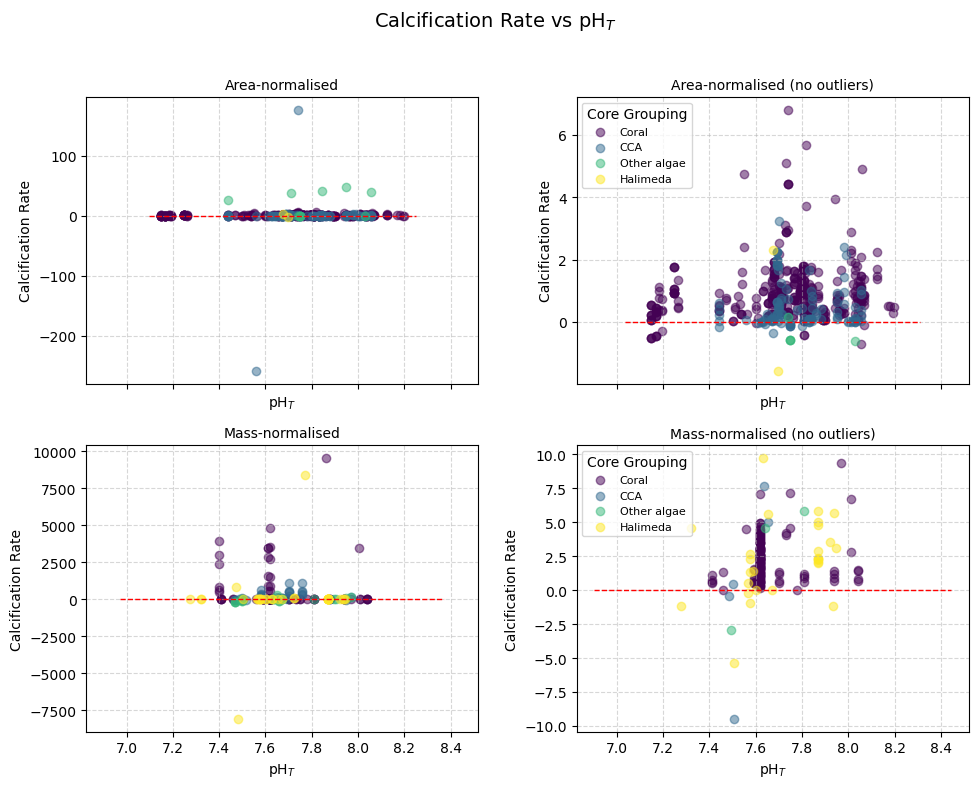

In [49]:
### naive plotting of calcification rates against absolute values of pH
### for two main unit subsets (mgCaCO3 cm-2d-1 and mgCaCO3 g-1d-1)

fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=True)
group_color_map = {
    group: color
    for group, color in zip(
        area_norm_df["core_grouping"].dropna().unique(),
        plt.cm.viridis(np.linspace(0, 1, area_norm_df["core_grouping"].nunique())),
    )
}

plots = [
    (0, 0, area_norm_df, "Area-normalised"),
    (0, 1, area_norm_no_outliers_df, "Area-normalised (no outliers)"),
    (1, 0, mass_norm_df, "Mass-normalised"),
    (1, 1, mass_norm_no_outliers_df, "Mass-normalised (no outliers)"),
]

for row, col, df, title in plots:
    ax = axes[row][col]
    for group, color in group_color_map.items():
        subset = df[df["core_grouping"] == group]
        ax.scatter(
            subset["phtot"],
            subset["st_calcification"],
            color=color,
            label=group,
            alpha=0.5,
        )
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("pH$_T$")
    ax.set_ylabel("Calcification Rate")
    ax.grid(ls="--", alpha=0.5)
    ax.hlines(0, *ax.get_xlim(), color="red", linestyle="--", linewidth=1)
    if col == 1:
        ax.legend(title="Core Grouping", loc="upper left", fontsize=8)

fig.suptitle("Calcification Rate vs pH$_T$", fontsize=14)
fig.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle
plt.show()


In [52]:
# ### area-normalised rate against temperature and pH, in 3D
# area_norm_no_outliers_df.loc[:, "points_weights"] = np.sqrt(
#     area_norm_no_outliers_df["st_calcification_sd"]
# ).copy()

# px.scatter_3d(
#     area_norm_no_outliers_df,
#     x="temp",
#     y="phtot",
#     z="st_calcification",
#     color="core_grouping",
#     title="3D Scatter plot of Standardized Calcification vs Temperature and pH",
#     labels={
#         "temp": "Temperature",
#         "phtot": "pH",
#         "st_calcification": "Standardized Calcification",
#     },
#     hover_name="species_types",
#     opacity=0.5,
#     size="points_weights",
#     width=800,
#     height=800,
# )


In [54]:
# ### mass-normalised rate against temperature nad pH, in 3D
# mass_norm_no_outliers_df.loc[:, "points_weights"] = np.sqrt(
#     mass_norm_no_outliers_df["st_calcification_sd"]
# ).copy()

# px.scatter_3d(
#     mass_norm_no_outliers_df,
#     x="temp",
#     y="phtot",
#     z="st_calcification",
#     color="core_grouping",
#     title="3D Scatter plot of Standardized Calcification vs Temperature and pH",
#     labels={
#         "temp": "Temperature",
#         "phtot": "pH",
#         "st_calcification": "Standardized Calcification",
#     },
#     hover_name="species_types",
#     opacity=0.5,
#     size="points_weights",
#     width=800,
#     height=800,
# )


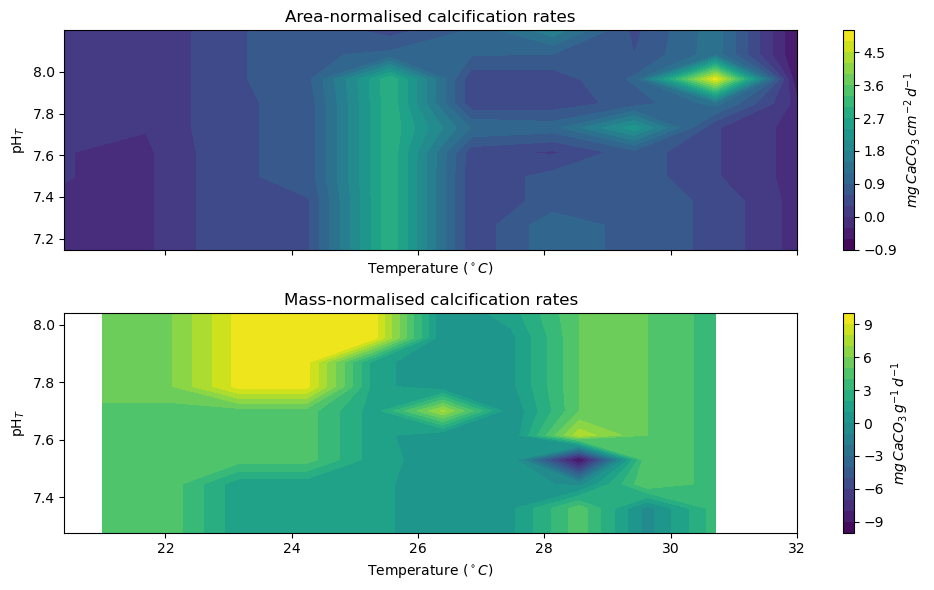

In [55]:
### contour plot of calcification rates against temperature and pH
fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
npoints = 10

area_x = np.linspace(
    area_norm_no_outliers_df.temp.min(), area_norm_no_outliers_df.temp.max(), npoints
)  # Temperature range
area_y = np.linspace(
    area_norm_no_outliers_df.phtot.min(), area_norm_no_outliers_df.phtot.max(), npoints
)  # pH range
mass_x = np.linspace(
    mass_norm_no_outliers_df.temp.min(), mass_norm_no_outliers_df.temp.max(), npoints
)  # Temperature range
mass_y = np.linspace(
    mass_norm_no_outliers_df.phtot.min(), mass_norm_no_outliers_df.phtot.max(), npoints
)  # pH range
analysis_plot.plot_contour(
    ax[0],
    area_x,
    area_y,
    area_norm_no_outliers_df,
    "Area-normalised calcification rates",
    legend_label=r"$mg \, CaCO_3 \, cm^{-2} \, d^{-1}$",
)
analysis_plot.plot_contour(
    ax[1],
    mass_x,
    mass_y,
    mass_norm_no_outliers_df,
    "Mass-normalised calcification rates",
    legend_label=r"$mg \, CaCO_3 \, g^{-1} \, d^{-1}$",
)

plt.tight_layout()

In [58]:
# ### fit a gaussian process regression model to the data
# fig, ax = plt.subplots(figsize=(10, 8))
# # filter nans
# df = area_norm_no_outliers_df.dropna(subset=["temp", "phtot", "st_calcification"])
# x = np.linspace(min(df["temp"]), max(df["temp"]), 100)
# y = np.linspace(min(df["phtot"]), max(df["phtot"]), 100)
# analysis_plot.plot_contour_gp(ax, x, y, df, "Calcification Rate vs. Temperature and pH")
# plt.tight_layout()

In [63]:
# ### visualise a 3d gaussian process regression
# interactive_plot.plot_3d_surface_gp(df)

## Effect sizes

In the assignment of treatment groups, two studies show up as problematic (no control). This is because calcification rates from explicitly-adapted corals (e.g. those near local CO2 seeps) have not been recorded. **Is this fair**? There are in fact a number of studies currently excluded due to this sort of thing. But it'd be interesting to see how these tally all together, perhaps in their own meta-analysis.

In [64]:
### define effect type for the proceeding cells
effect_type = "st_relative_calcification"

In [ ]:
### generating effect sizes
print(f"Shape of dataframe with effect sizes: {data_df.shape}")
print(data_df["treatment"].value_counts())
working_data_df = data_df.copy()
effect_sizes = [
    "cohens_d",
    "hedges_g",
    "relative_calcification",
    "absolute_calcification",
    "st_relative_calcification",
    "st_absolute_calcification",
]

Shape of dataframe with effect sizes: (1239, 117)
treatment
phtot            598
temp             237
phtot_mv         152
temp_mv          145
phtot_temp_mv    107
Name: count, dtype: int64


In [ ]:
### relative calcification as function of temperature and pH, in 3D
data_df[f"{effect_type}_var"] = pd.to_numeric(
    data_df[f"{effect_type}_var"], errors="coerce"
)

data_df.loc[:, "points_weights"] = np.sqrt(
    pd.to_numeric(data_df[f"{effect_type}_var"], errors="coerce")
)
px.scatter_3d(
    data_df,
    x="temp",
    y="phtot",
    z="st_relative_calcification",
    color="core_grouping",
    title="3D Scatter plot of Standardized Calcification vs Temperature and pH",
    labels={
        "temp": "Temperature",
        "phtot": "pH",
        "st_relative_calcification": "Relative standardized Calcification",
    },
    hover_name="species_types",
    opacity=0.5,
    size="points_weights",
    width=800,
    height=800,
)


In [70]:
### relative calcification as function of DELTA(temperature) and DELTA(pH), in 3D

data_df[f"{effect_type}_var"] = pd.to_numeric(
    data_df[f"{effect_type}_var"], errors="coerce"
)

data_df.loc[:, "points_weights"] = np.sqrt(
    pd.to_numeric(data_df["st_relative_calcification_var"], errors="coerce")
)
px.scatter_3d(
    data_df,
    x="delta_t",
    y="delta_ph",
    z="st_relative_calcification",
    color="core_grouping",
    title="3D Scatter plot of Standardized Calcification vs Temperature and pH",
    labels={
        "temp": "Temperature",
        "phtot": "pH",
        "st_relative_calcification": "Relative standardized Calcification",
    },
    hover_name="species_types",
    opacity=0.5,
    size="points_weights",
    width=800,
    height=800,
)

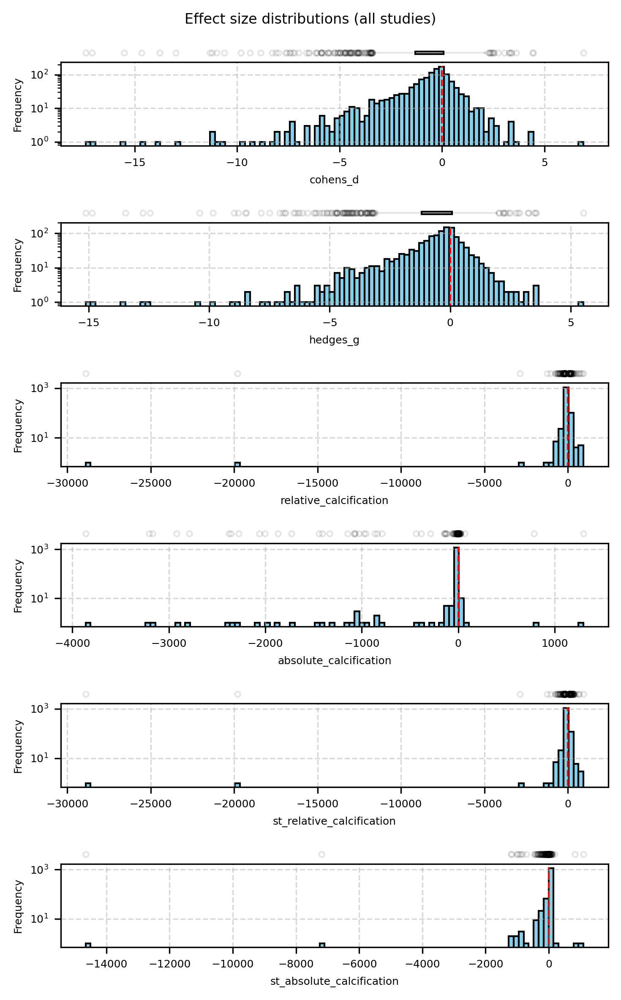

In [71]:
### visualise distributions of effect sizes (all studies)
data_exploration.plot_effect_size_distributions(
    data_df,
    title="Effect size distributions (all studies)",
)

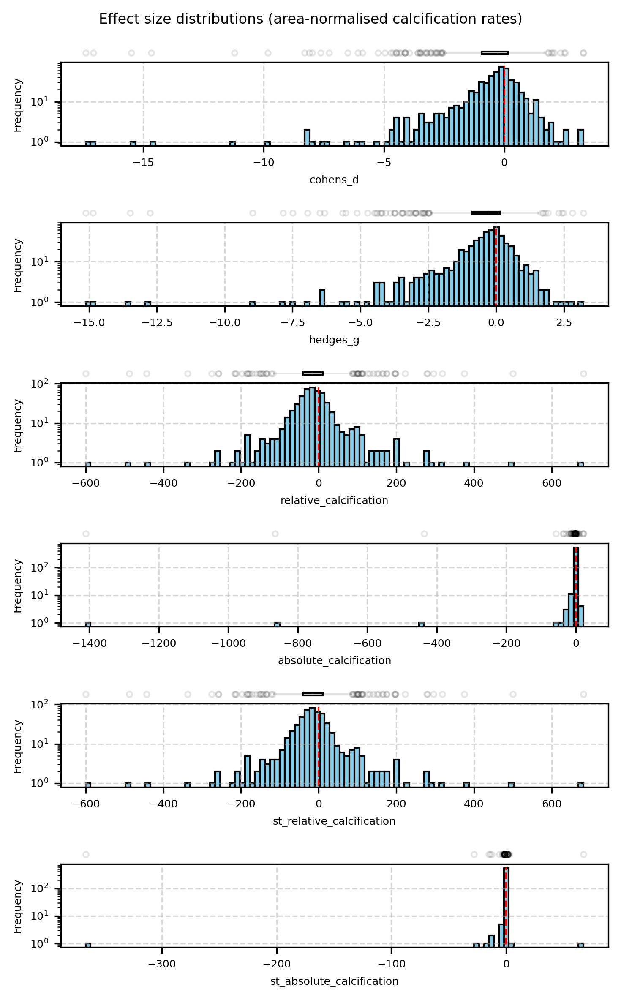

In [72]:
### visualise distributions of effect sizes (area-normalised calcification rates)
data_exploration.plot_effect_size_distributions(
    data_df[data_df["st_calcification_unit"] == "mgCaCO3 cm-2d-1"],
    title="Effect size distributions (area-normalised calcification rates)",
)


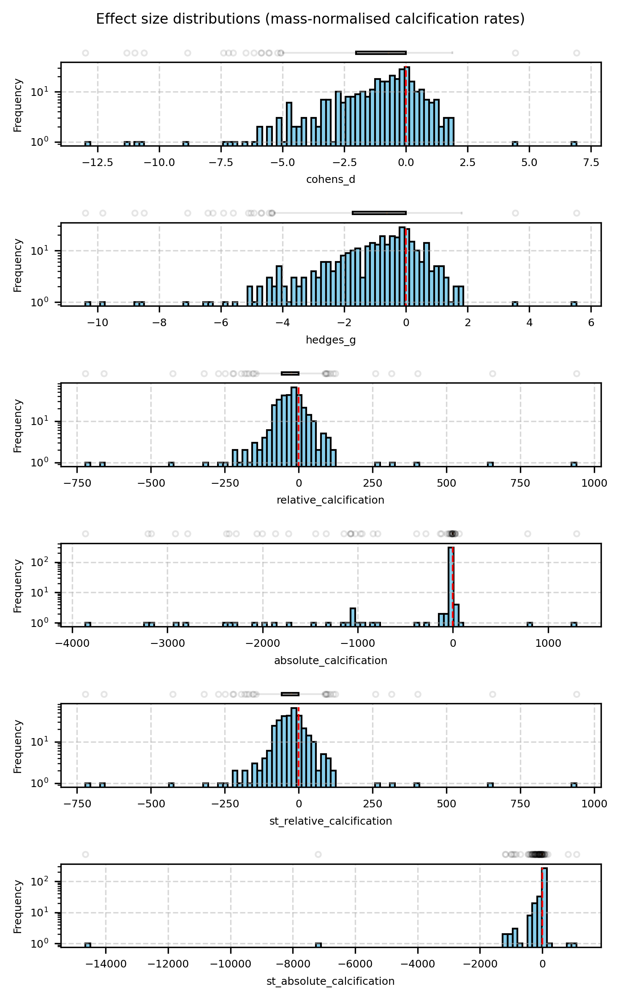

In [73]:
### visualise distributions of effect sizes (mass-normalised calcification rates)
data_exploration.plot_effect_size_distributions(
    data_df[data_df["st_calcification_unit"] == "mgCaCO3 g-1d-1"],
    title="Effect size distributions (mass-normalised calcification rates)",
)

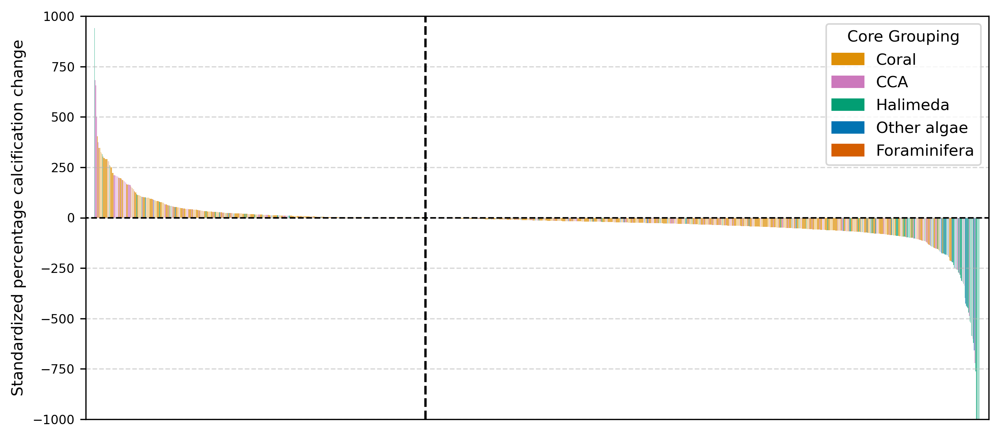

In [ ]:
ordered_data_df = (
    data_df.sort_values(by="st_relative_calcification", ascending=False)
    .reset_index(drop=True)
    .copy()
)
# Map core_grouping to colors
unique_groups = ordered_data_df["core_grouping"].unique()

# Plot the bar chart
fig, ax = plt.subplots(figsize=(9, 4), dpi=300)
ax.bar(
    ordered_data_df.index,
    ordered_data_df["st_relative_calcification"],
    # yerr=np.sqrt(ordered_data_df['st_relative_calcification_var']),
    capsize=5,
    color=ordered_data_df["core_grouping"].map(plot_config.CG_COLOURS),
    alpha=0.7,
)
ax.hlines(0, *ax.get_xlim(), color="black", linestyle="--", linewidth=1)
ax.set_ylim(-1000, 1000)
ax.set_xticks([])
# Add labels and title
ax.set_ylabel("Standardized percentage calcification change")
ax.grid(ls="--", alpha=0.5)
ax.set_xlim(
    -len(ordered_data_df.index) * 0.01,
    len(ordered_data_df.index) * 1.01,
)
ax.tick_params(axis="y", labelsize=8)
# Add a legend for core_grouping
handles = [
    Patch(color=color, label=group) for group, color in plot_config.CG_COLOURS.items()
]
ax.legend(handles=handles, title="Core Grouping", loc="upper right")
first_zero_idx = ordered_data_df[
    ordered_data_df["st_relative_calcification"] <= 0
].index[0]
ax.vlines(
    first_zero_idx,
    *ax.get_ylim(),
    color="black",
    linestyle="--",
)

plt.tight_layout()
plt.show()

The 95th percentile is: -634.73


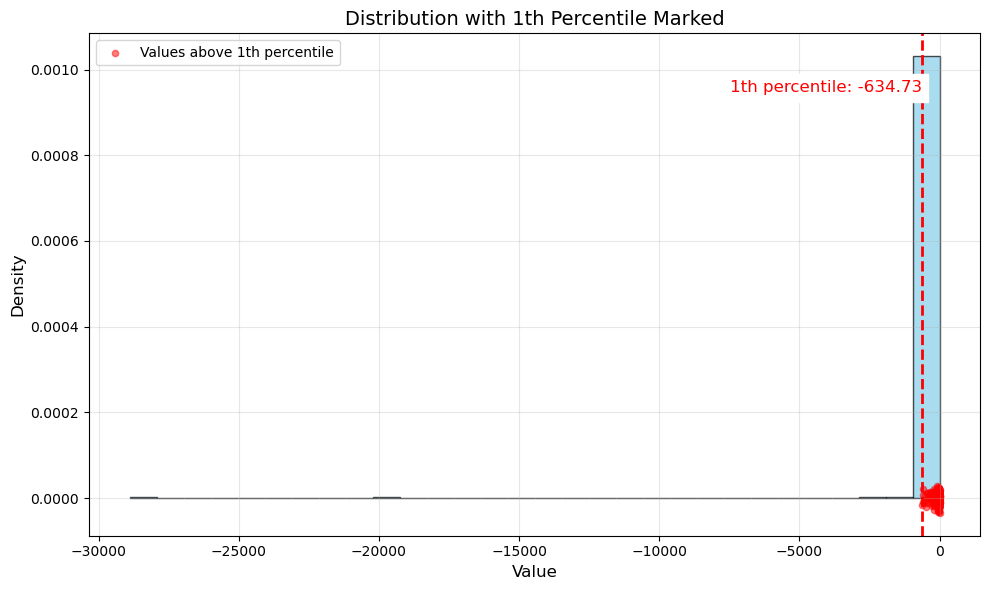

In [76]:
### plot a cumulative distribution of effect sizes. TODO: fix this
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats


def plot_and_find_percentile(data, percentile=95, figsize=(10, 6), bins=30):
    """
    Plots a histogram of the data with the specified percentile marked,
    and returns the percentile value.

    Args:
        data (array-like): The data values to analyze
        percentile (float): Percentile to calculate (default: 95)
        figsize (tuple): Figure size as (width, height)
        bins (int): Number of histogram bins

    Returns:
        float: The value at the specified percentile
    """
    # Calculate the percentile
    percentile_value = np.percentile(data, percentile)

    # Create the figure
    fig, ax = plt.subplots(figsize=figsize)

    # Plot histogram
    counts, bins, patches = ax.hist(
        data, bins=bins, alpha=0.7, color="skyblue", edgecolor="black", density=True
    )

    # Add a vertical line at the percentile
    ax.axvline(x=percentile_value, color="red", linestyle="--", linewidth=2)

    # Add text annotation for the percentile value
    ax.text(
        percentile_value,
        0.9 * ax.get_ylim()[1],
        f"{percentile}th percentile: {percentile_value:.2f}",
        color="red",
        ha="right",
        va="top",
        backgroundcolor="white",
        fontsize=12,
    )

    # Add kernel density estimate
    # x = np.linspace(min(data), max(data), 1000)
    # kde = stats.gaussian_kde(data)
    # ax.plot(x, kde(x), 'k-', linewidth=2, label='Density Estimate')

    # Mark data above the percentile
    above_percentile = data[data >= percentile_value]
    if len(above_percentile) > 0:
        jitter = np.random.normal(
            0, 0.01 * ax.get_ylim()[1], size=len(above_percentile)
        )
        ax.scatter(
            above_percentile,
            jitter,
            color="red",
            alpha=0.5,
            s=20,
            label=f"Values above {percentile}th percentile",
        )

    # Add labels and title
    ax.set_xlabel("Value", fontsize=12)
    ax.set_ylabel("Density", fontsize=12)
    ax.set_title(f"Distribution with {percentile}th Percentile Marked", fontsize=14)

    # Add grid and legend
    ax.grid(True, alpha=0.3)
    ax.legend()

    plt.tight_layout()

    return fig, percentile_value


# Plot the data and find the 95th percentile
fig, percentile_95 = plot_and_find_percentile(
    data_df[data_df["st_relative_calcification"] < 0]["st_relative_calcification"],
    percentile=1,
    figsize=(10, 6),
    bins=30,
)
print(f"The 95th percentile is: {percentile_95:.2f}")

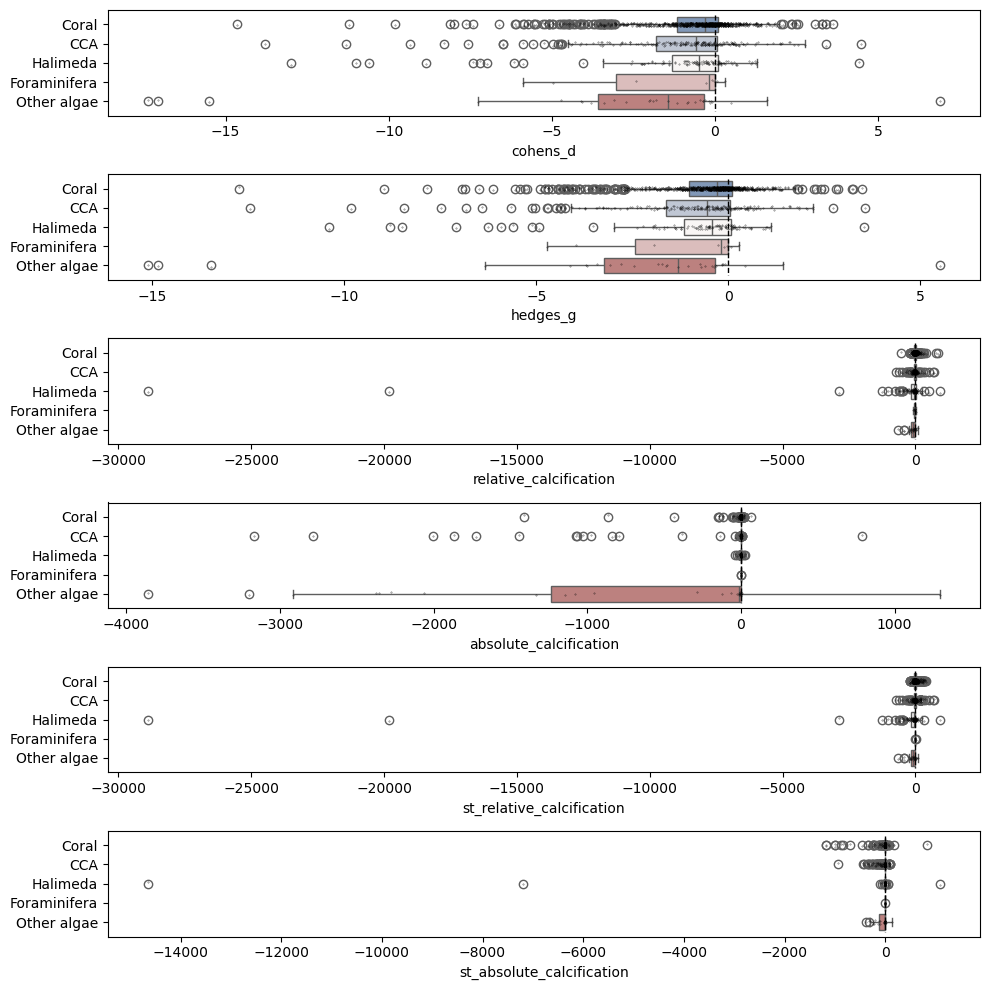

In [78]:
### break down effect size by core_grouping
fig, axes = plt.subplots(len(effect_sizes), 1, figsize=(10, 10), sharex=False)

for i, effect_size in enumerate(
    effect_sizes
):  # plot the effect sizes for each core grouping
    sns.boxplot(
        data=data_df,
        x=effect_size,
        y="core_grouping",
        palette="vlag",
        hue="core_grouping",
        ax=axes[i],
    )
    sns.stripplot(
        data=data_df,
        x=effect_size,
        y="core_grouping",
        ax=axes[i],
        alpha=0.3,
        marker="x",
        s=1,
        color="black",
        linewidth=1,
    )
    axes[i].vlines(
        x=0,
        ymin=-0.5,
        ymax=len(data_df["core_grouping"].unique()) - 0.5,
        color="black",
        linestyle="--",
        linewidth=1,
        zorder=10,
    )
    axes[i].set_ylabel("")
plt.tight_layout()

/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_73118/1241257444.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




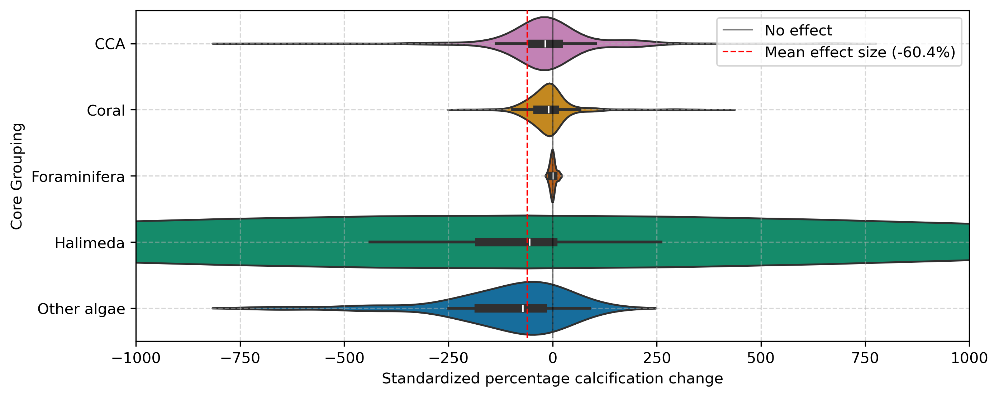

In [ ]:
### break down effect size by core_grouping
fig, ax = plt.subplots(figsize=(10, 4), dpi=300)

# make seaborn pallet from CG_COLOURS dictionary
cmap = LinearSegmentedColormap.from_list(
    "custom_palette",
    [to_hex(color) for color in plot_config.CG_COLOURS.values()],
    N=len(plot_config.CG_COLOURS),
)
# create a color mapping for the core_grouping
color_mapping = {
    group: cmap(i) for i, group in enumerate(ordered_data_df["core_grouping"].unique())
}
# plot the violin plot
sns.violinplot(
    data=data_df.sort_values("core_grouping", ascending=False),
    x="st_relative_calcification",
    y="core_grouping",
    palette=plot_config.CG_COLOURS,
    ax=ax,
)
ax.set_xlim(-1000, 1000)
ax.grid(ls="--", alpha=0.5)
ax.set_ylabel("Core Grouping")
ax.set_xlabel("Standardized percentage calcification change")
ax.vlines(
    x=0,
    ymin=min(ax.get_ylim()) * 0.9,
    ymax=max(ax.get_ylim()) * 1.1,
    color="black",
    linestyle="-",
    linewidth=1,
    alpha=0.5,
    zorder=10,
    label="No effect",
)
ax.set_ylim(
    # min(ax.get_ylim())*0.9,
    -0.5,
    4.5,
)
# plot arrow at mean effect size
mean_effect_size = data_df["st_relative_calcification"].mean()
ax.vlines(
    x=mean_effect_size,
    ymin=min(ax.get_ylim()) * 0.9,
    ymax=max(ax.get_ylim()) * 1.1,
    color="red",
    linestyle="--",
    linewidth=1,
    zorder=10,
    label=f"Mean effect size ({mean_effect_size:.1f}%)",
)
ax.legend(loc="upper right")

/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_73118/2481349566.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




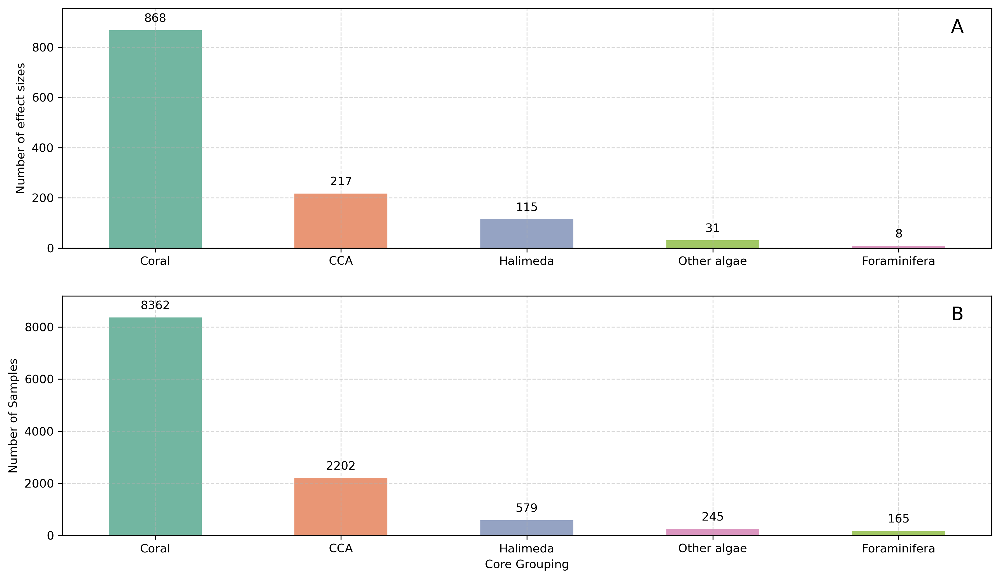

In [82]:
### Combined visualization of the number of effect sizes per core grouping and by number of samples
fig, axes = plt.subplots(2, 1, figsize=(12, 7), dpi=300, sharex=False)

# Plot 1: Number of effect sizes per core grouping
count_order = (
    data_df["core_grouping"].value_counts().index
)  # order by number of effect sizes
sns.countplot(
    data=data_df,
    x="core_grouping",
    order=count_order,
    palette="Set2",
    hue="core_grouping",
    ax=axes[0],
    width=0.5,
)
# Format
for p in axes[0].patches:
    axes[0].annotate(
        f"{int(p.get_height())}",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
axes[0].set_ylim(0, data_df["core_grouping"].value_counts().max() * 1.1)
# axes[0].set_title('Number of Effect Sizes per Core Grouping', fontsize=12)
# axes[0].set_xlabel('Core Grouping')
axes[0].set_ylabel("Number of effect sizes")
axes[0].grid(ls="--", alpha=0.5)

# Plot 2: Number of effect sizes per core grouping by number of samples
cg_sample_counts = (
    data_df.groupby("core_grouping")["n"].sum().sort_values(ascending=False)
)
sns.barplot(
    x=cg_sample_counts.index,
    y=cg_sample_counts.values,
    palette="Set2",
    ax=axes[1],
    width=0.5,
)
# Format
for p in axes[1].patches:
    axes[1].annotate(
        f"{int(p.get_height())}",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=10,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
axes[1].set_ylim(0, cg_sample_counts.max() * 1.1)
# axes[1].set_title('Number of Samples Corresponding to Effect Sizes per Core Grouping', fontsize=12)
axes[1].set_xlabel("Core Grouping")
axes[1].set_ylabel("Number of Samples")
axes[1].grid(ls="--", alpha=0.5)
axes[0].set_xlabel(" ")

for i, ax in enumerate(axes.flatten()):
    # fetch coordinates of top right hand corner of specific axis
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    # annotate with letter
    ax.annotate(
        chr(65 + i),
        xy=(0.97, 0.92),
        xycoords="axes fraction",
        fontsize=16,
        ha="right",
        va="center",
        # bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white')
    )

# Adjust layout
plt.tight_layout()
plt.show()

Number of distinct types of calcification measurement: 7


/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_73118/3163387747.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Text(0, 0.5, 'Number of samples corresponding to effect sizes')

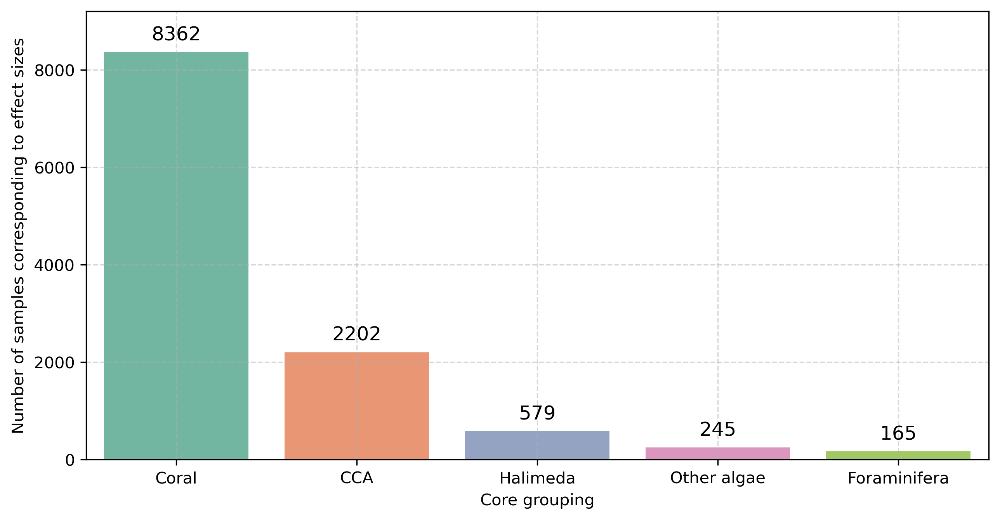

In [83]:
### visualise the number of effect sizes per core grouping, by number of samples
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

cg_sample_counts = (
    data_df.groupby("core_grouping")["n"].sum().sort_values(ascending=False)
)

sns.barplot(x=cg_sample_counts.index, y=cg_sample_counts.values, palette="Set2")
# format
for p in plt.gca().patches:
    plt.annotate(
        f"{int(p.get_height())}",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        fontsize=12,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
plt.ylim(0, cg_sample_counts.max() * 1.1)
# plt.title('Number of effect sizes per core grouping')
plt.grid(ls="--", alpha=0.5)
# report
print(
    f"Number of distinct types of calcification measurement: {len(data_df['st_calcification_unit'].unique())}"
)
plt.xlabel("Core grouping")
plt.ylabel("Number of samples corresponding to effect sizes")

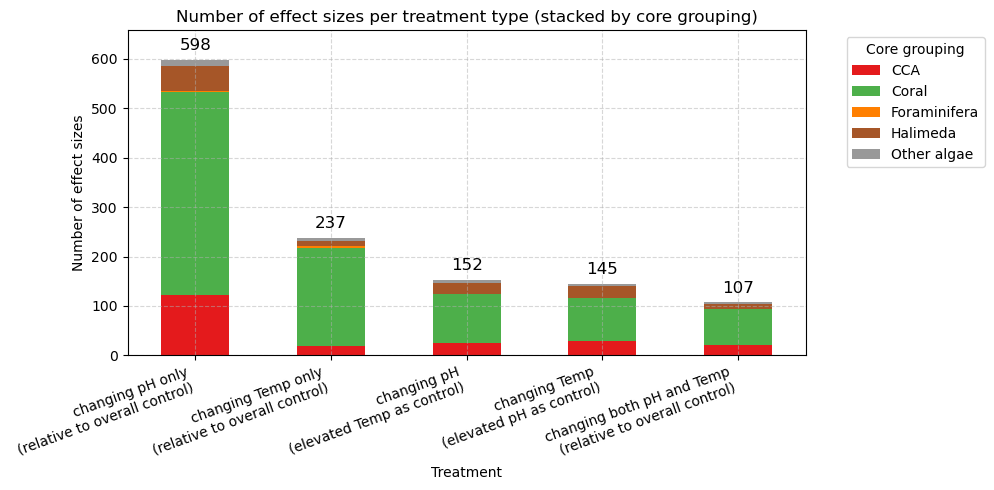

In [84]:
### visualise the number of effect sizes per treatment, stacked by core_grouping
fig, ax = plt.subplots(figsize=(10, 5))

# group by treatment and core_grouping, then count occurrences
stacked_data = (
    data_df.groupby(["treatment", "core_grouping"]).size().unstack(fill_value=0)
)
ordered_treatments = stacked_data.sum(axis=1).sort_values(ascending=False).index
# plot
stacked_data.loc[ordered_treatments].plot(
    kind="bar", stacked=True, ax=ax, colormap="Set1"
)

# format
plt.title("Number of effect sizes per treatment type (stacked by core grouping)")
plt.xlabel("Treatment")
plt.ylabel("Number of effect sizes")
plt.grid(ls="--", alpha=0.5)
for i, value in enumerate(stacked_data.loc[ordered_treatments].sum(axis=1).values):
    plt.annotate(
        f"{int(value)}",
        (i, value),
        ha="center",
        va="bottom",
        fontsize=12,
        color="black",
        xytext=(0, 5),
        textcoords="offset points",
    )
plt.ylim(0, stacked_data.loc[ordered_treatments].sum(axis=1).max() * 1.1)

# update the x-ticks with the treatment names
treatment_map = {
    "phtot": "changing pH only\n(relative to overall control)",
    "temp": "changing Temp only\n(relative to overall control)",
    "phtot_mv": "changing pH\n(elevated Temp as control)",
    "temp_mv": "changing Temp\n(elevated pH as control)",
    "phtot_temp_mv": "changing both pH and Temp\n(relative to overall control)",
}
ax.set_xticklabels(
    [treatment_map.get(treatment, treatment) for treatment in ordered_treatments],
    rotation=20,
    ha="right",
)

# legend
plt.legend(title="Core grouping", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()

In [94]:
data_df.longitude.isna().sum()


np.int64(296)

Skipping DOI 10.1002/lno.10952 due to missing latitude/longitude.
Skipping DOI 10.1007/s00227-016-2909-8 due to missing latitude/longitude.
Skipping DOI 10.1007/s00227-016-2986-8 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-008-0380-9 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-011-0819-2 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-014-1132-7 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-015-1342-7 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-016-1405-4 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-017-1547-z due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-017-1547-z-LOC-B due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-017-1567-8 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-020-01995-7 due to missing latitude/longitude.
Skipping DOI 10.1007/s00338-021-02170-2 due to missing latitude/longitude.
Skipping DOI 10.1007/s00425-013-1982-1

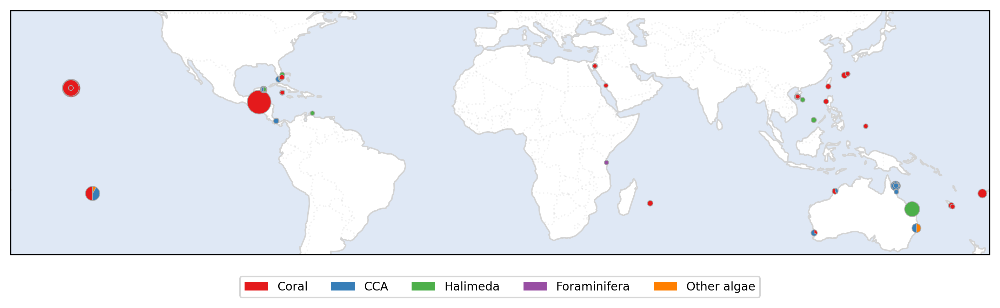

In [88]:
### plot the ratio of effect size types as pie charts on a map
fig, ax = plt.subplots(
    figsize=(12, 6), dpi=300, subplot_kw={"projection": ccrs.PlateCarree()}
)
ax = plot_utils.format_geo_axes(ax)

unique_groups = data_df["core_grouping"].unique()
group_colors = {grp: color for grp, color in zip(unique_groups, plt.cm.Set1.colors)}

for doi, group in data_df.groupby("doi"):
    if group["latitude"].isna().any() or group["longitude"].isna().any():
        print(f"Skipping DOI {doi} due to missing latitude/longitude.")
        continue
    lat = group["latitude"].values[0]
    lon = group["longitude"].values[0]

    group_counts = group[
        "core_grouping"
    ].value_counts()  # count number of effect sizes per core_grouping within this DOI

    if (
        group_counts.empty or group_counts.sum() == 0
    ):  # if nothing to plot, or zero counts
        continue
    sizes = group_counts.values
    labels = group_counts.index

    # only plot groups with non-zero counts
    valid_indices = [i for i, size in enumerate(sizes) if size > 0]
    if not valid_indices:
        continue
    sizes = [sizes[i] for i in valid_indices]
    labels = [labels[i] for i in valid_indices]
    colors = [group_colors[labels[i]] for i in valid_indices]

    # scale pie chart size by total number of effect sizes
    n_effect_sizes = sum(sizes)
    size = 0.05 + n_effect_sizes * 0.002  # manually tweaked

    # create inset axis at the study's geographic location
    pie_ax = inset_axes(
        ax,
        width=size,
        height=size,
        loc="center",
        bbox_to_anchor=(lon, lat),
        bbox_transform=ax.transData,
        borderpad=0,
    )
    if len(sizes) > 0:
        wedges, _ = pie_ax.pie(
            sizes,
            colors=colors,
            startangle=90,
            wedgeprops={"edgecolor": "darkgrey", "linewidth": 0.5},
        )
        pie_ax.set_aspect("equal")
        pie_ax.axis("off")  # hide pie chart axis

legend_elements = [
    Patch(facecolor=group_colors[grp], label=str(grp)) for grp in unique_groups
]
ax.legend(
    handles=legend_elements,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.2),
    ncols=len(unique_groups),
    fontsize=8,
)

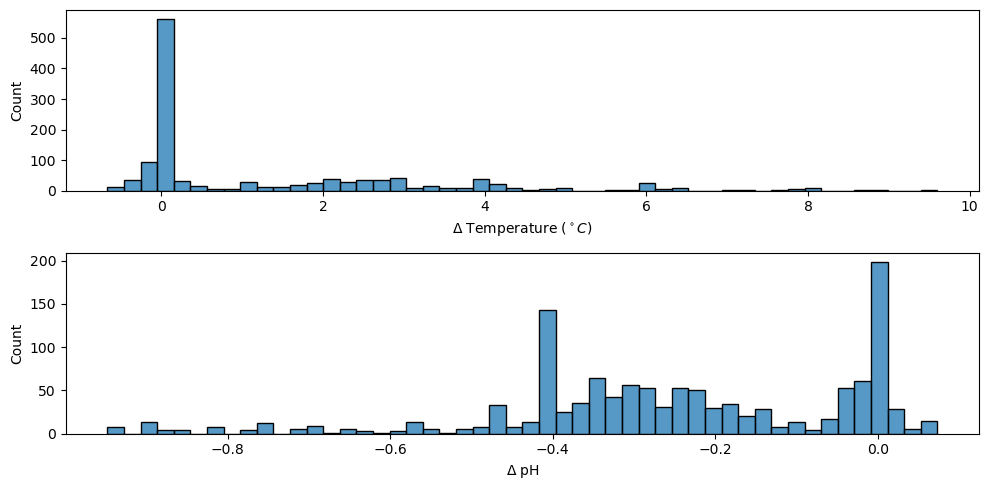

In [89]:
### plot distribution of delta ph and delta_t
fig, axes = plt.subplots(2, 1, figsize=(10, 5))
# Plot delta_t
sns.histplot(
    data=data_df,
    x="delta_t",
    bins=50,
    ax=axes[0],
)
axes[0].set_xlabel("$\\Delta$ Temperature ($^\\circ C$)")
# Plot delta_pH
sns.histplot(
    data=data_df,
    x="delta_ph",
    bins=50,
    ax=axes[1],
)
axes[1].set_xlabel("$\\Delta$ pH")
plt.tight_layout()

## Meta-regression

In [90]:
### set effect type for all proceeding cells
effect_type = "st_relative_calcification"
print(f"{data_df.treatment.value_counts()}\n\t\t of {len(data_df)} total effect sizes")

treatment
phtot            598
temp             237
phtot_mv         152
temp_mv          145
phtot_temp_mv    107
Name: count, dtype: int64
		 of 1239 total effect sizes


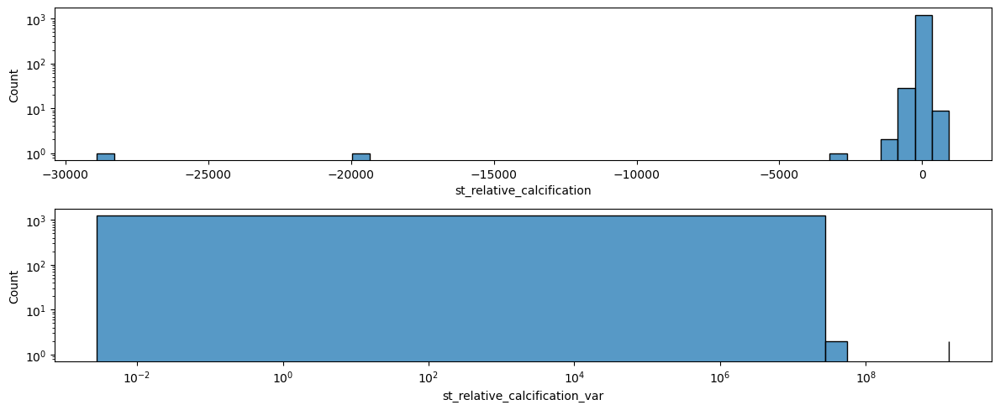

In [91]:
### visualise distribution of effect sizes and their variances for outlier removal
fig, ax = plt.subplots(2, 1, figsize=(12, 5), sharey=True)
# plot
sns.histplot(
    data=data_df,
    x=effect_type,
    bins=50,
    ax=ax[0],
)
sns.histplot(
    data=data_df,
    x="st_relative_calcification_var",
    bins=50,
    ax=ax[1],
)
# format
ax[1].set_xscale("log")
ax[1].set_yscale("log")
plt.tight_layout()


Number of effect sizes before filtering: 1239
Number of effect sizes after filtering: 1101


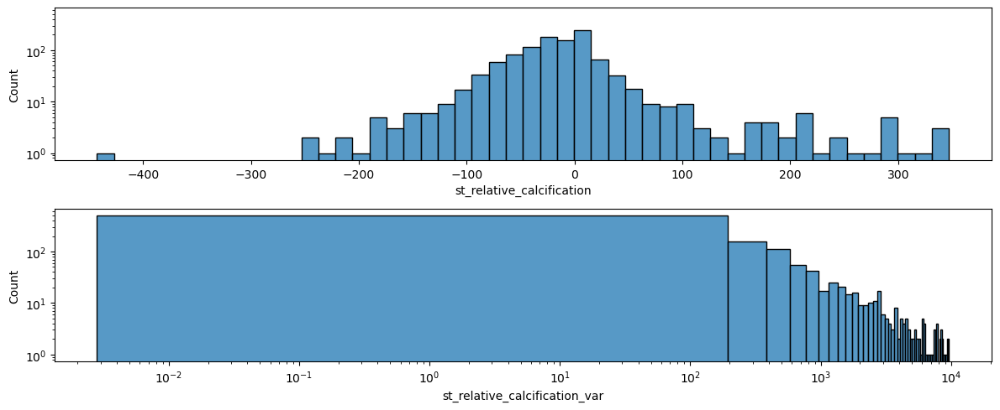

In [ ]:
### filter outliers via robust z-score

filtered_effects_df = data_df.copy()
# add 0.001 to any 0 st_relative_calcification_var values
# filtered_effects_df['st_relative_calcification_var'] = filtered_effects_df['st_relative_calcification_var'].replace(0, 0.001).infer_objects(copy=False)

filtered_effects_df = filtered_effects_df[
    analysis_utils.filter_robust_zscore(
        filtered_effects_df["st_relative_calcification"]
    )
    & analysis_utils.filter_robust_zscore(
        filtered_effects_df["st_relative_calcification_var"]
    )
]
# print removal stats
print(f"Number of effect sizes before filtering: {len(data_df)}")
print(f"Number of effect sizes after filtering: {len(filtered_effects_df)}")

### visualise distribution of effect sizes and their variances for outlier removal
fig, ax = plt.subplots(2, 1, figsize=(12, 5), sharey=True)
# plot
sns.histplot(
    data=filtered_effects_df,
    x=effect_type,
    bins=50,
    ax=ax[0],
)
sns.histplot(
    data=filtered_effects_df,
    x="st_relative_calcification_var",
    bins=50,
    ax=ax[1],
)
# format
ax[1].set_xscale("log")
ax[1].set_yscale("log")
plt.tight_layout()

## Treatment conditions

In [105]:
local_climatology_df


,doi,location,longitude,latitude,authors,calcification,calcification_sd,calcification_se,calcification_unit,cleaned_coords,...,percentile_10_historical_ph_30y_ensemble,mean_ph_20y_ensemble,ph_percentile_90_mean_ensemble,ph_percentile_10_mean_ensemble,mean_ph_20y_anomaly_ensemble,ph_percentile_90_anomaly_ensemble,ph_percentile_10_anomaly_ensemble,points_weights,delta_t_clim,delta_ph_clim
0,NaN,NaN,165.94553,-21.968602,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.379590,NaN,NaN
1,NaN,NaN,165.94553,-21.968602,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.131320,NaN,NaN
2,NaN,NaN,165.94553,-21.968602,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.505579,NaN,NaN
3,NaN,NaN,165.94553,-21.968602,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.691265,NaN,NaN
4,NaN,NaN,165.94553,-21.968602,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.892492,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.935076,NaN,NaN
1235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.089743,NaN,NaN
1236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.715503,NaN,NaN
1237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.549603,NaN,NaN


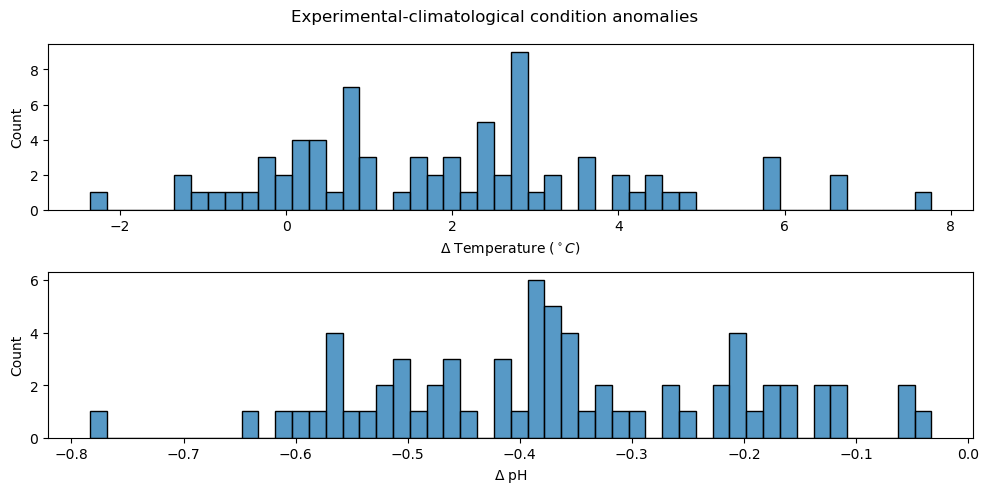

In [ ]:
import seaborn as sns

# plot histograms of delta_t_clim and delta_ph_clim
fig, axes = plt.subplots(2, 1, figsize=(10, 5))
# plot
sns.histplot(
    data=local_climatology_df.groupby(level="doi").first(),
    x="delta_t_clim",
    bins=50,
    ax=axes[0],
)
sns.histplot(
    data=local_climatology_df.groupby(level="doi").first(),
    x="delta_ph_clim",
    bins=50,
    ax=axes[1],
)
# format
axes[0].set_xlabel("$\\Delta$ Temperature ($^\\circ C$)")
axes[1].set_xlabel("$\\Delta$ pH")
plt.suptitle("Experimental-climatological condition anomalies")
plt.tight_layout()


In [101]:
# group the data_df by doi, irr, and species_type, then get the average temp and phtot of the cTcP group
control_vals = (
    data_df[data_df.treatment_group == "cTcP"]
    .groupby(["doi", "irr", "species_types"])
    .agg({"temp": "mean", "phtot": "mean"})
    .reset_index()
)

# join control values to local_climatology_df
climate_controls_df = local_climatology_df.merge(
    control_vals,
    how="left",
    on=["doi", "irr", "species_types"],
    suffixes=("", "_CONTROL"),
)
# calculate delta_t_clim and delta_ph_clim (mean_historical_sst_30y_ensemble and mean_historical_ph_30y_ensemble minus the phtot and temp columns)
climate_controls_df["delta_t_clim_control"] = (
    climate_controls_df["temp_CONTROL"]
    - climate_controls_df["mean_historical_sst_30y_ensemble"]
)
climate_controls_df["delta_ph_clim_control"] = (
    climate_controls_df["phtot_CONTROL"]
    - climate_controls_df["mean_historical_ph_30y_ensemble"]
)


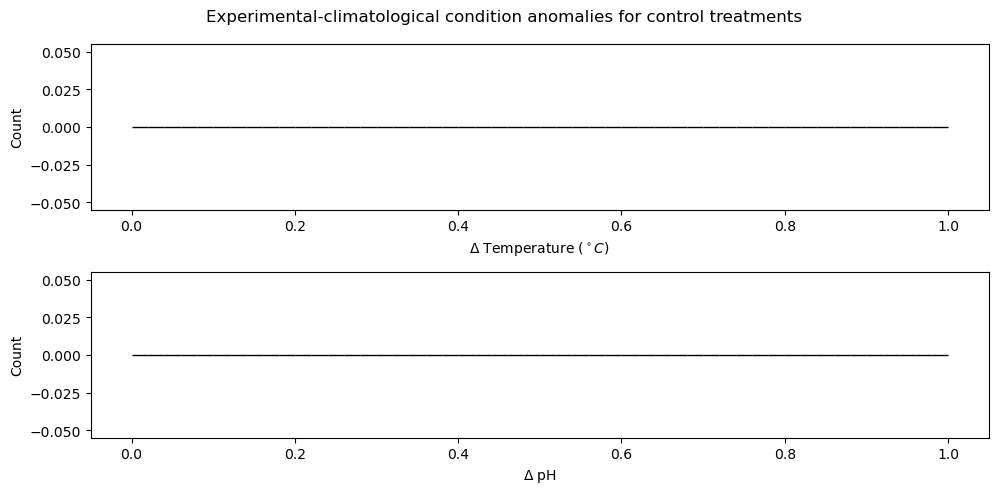

In [102]:
# calculate delta_t_clim and delta_ph_clim (mean_historical_sst_30y_ensemble and mean_historical_ph_30y_ensemble minus the phtot and temp columns)

# extreme values here are people doing experiments on corals outside their natural range, or investigating e.g. the whole range of conditions. The latter would justify assigning controls based on the values closest to the long-term climatology. Don't particularly want to get into that at this late stage...

# plot histograms of delta_t_clim and delta_ph_clim
fig, axes = plt.subplots(2, 1, figsize=(10, 5))
# Plot delta_t_clim
sns.histplot(
    data=climate_controls_df,
    x="delta_t_clim_control",
    bins=50,
    ax=axes[0],
)
axes[0].set_xlabel("$\\Delta$ Temperature ($^\\circ C$)")
# Plot delta_ph_clim
sns.histplot(
    data=climate_controls_df,
    x="delta_ph_clim_control",
    bins=50,
    ax=axes[1],
)
axes[1].set_xlabel("$\\Delta$ pH")
plt.suptitle("Experimental-climatological condition anomalies for control treatments")
plt.tight_layout()


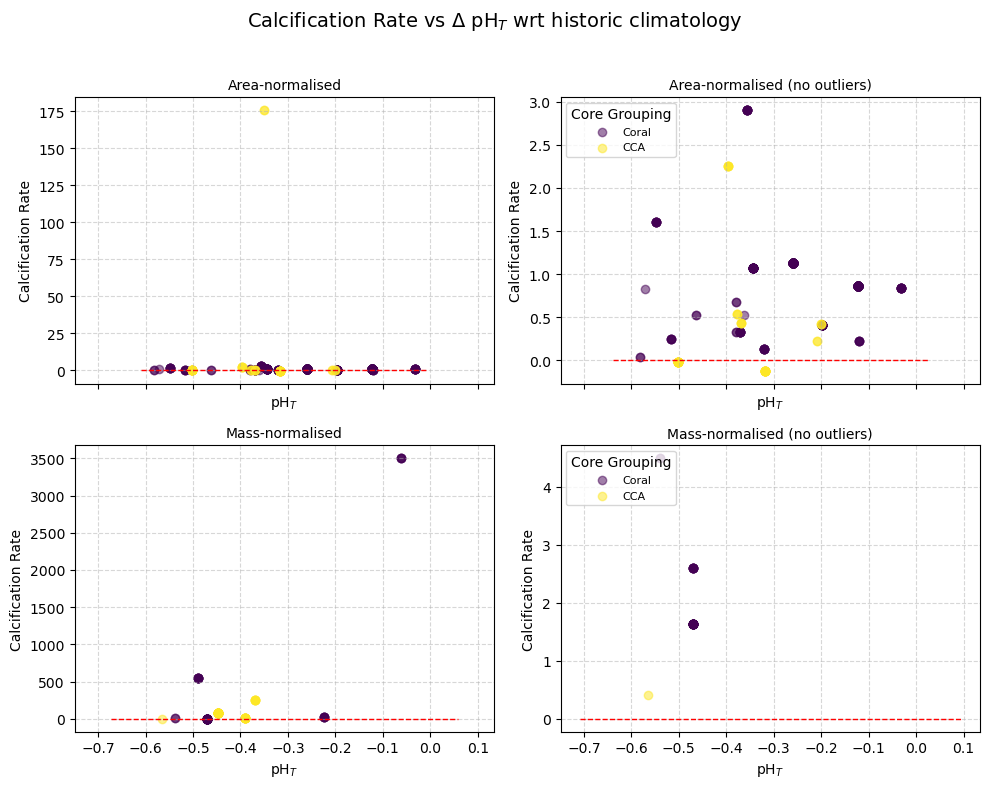

In [103]:
### TODO: does it make sense just to plot climatology anomalies against raw calcification rates?

### scatter of climatology anomalies against calcification rates
area_norm_clim_df = local_climatology_df[
    local_climatology_df["st_calcification_unit"] == "mgCaCO3 cm-2d-1"
].copy()
mass_norm_clim_df = local_climatology_df[
    local_climatology_df["st_calcification_unit"] == "mgCaCO3 g-1d-1"
].copy()

# TODO: these currently assigned by sight due to large inherent variance
area_norm_clim_no_outliers_df = area_norm_clim_df[
    (area_norm_clim_df.st_calcification > -10)
    & (area_norm_clim_df.st_calcification < 10)
]
mass_norm_clim_no_outliers_df = mass_norm_clim_df[
    (mass_norm_clim_df.st_calcification > -10)
    & (mass_norm_clim_df.st_calcification < 10)
]

fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=True)
group_color_map = {
    group: color
    for group, color in zip(
        area_norm_clim_df["core_grouping"].dropna().unique(),
        plt.cm.viridis(np.linspace(0, 1, area_norm_clim_df["core_grouping"].nunique())),
    )
}

plots = [
    (0, 0, area_norm_clim_df, "Area-normalised"),
    (0, 1, area_norm_clim_no_outliers_df, "Area-normalised (no outliers)"),
    (1, 0, mass_norm_clim_df, "Mass-normalised"),
    (1, 1, mass_norm_clim_no_outliers_df, "Mass-normalised (no outliers)"),
]

for row, col, df, title in plots:
    ax = axes[row][col]
    for group, color in group_color_map.items():
        subset = df[df["core_grouping"] == group]
        ax.scatter(
            subset["delta_ph_clim"],
            subset["st_calcification"],
            color=color,
            label=group,
            alpha=0.5,
        )
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("pH$_T$")
    ax.set_ylabel("Calcification Rate")
    ax.grid(ls="--", alpha=0.5)
    ax.hlines(0, *ax.get_xlim(), color="red", linestyle="--", linewidth=1)
    if col == 1:
        ax.legend(title="Core Grouping", loc="upper left", fontsize=8)

fig.suptitle(
    "Calcification Rate vs $\\Delta$ pH$_T$ wrt historic climatology", fontsize=14
)
fig.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle
plt.show()


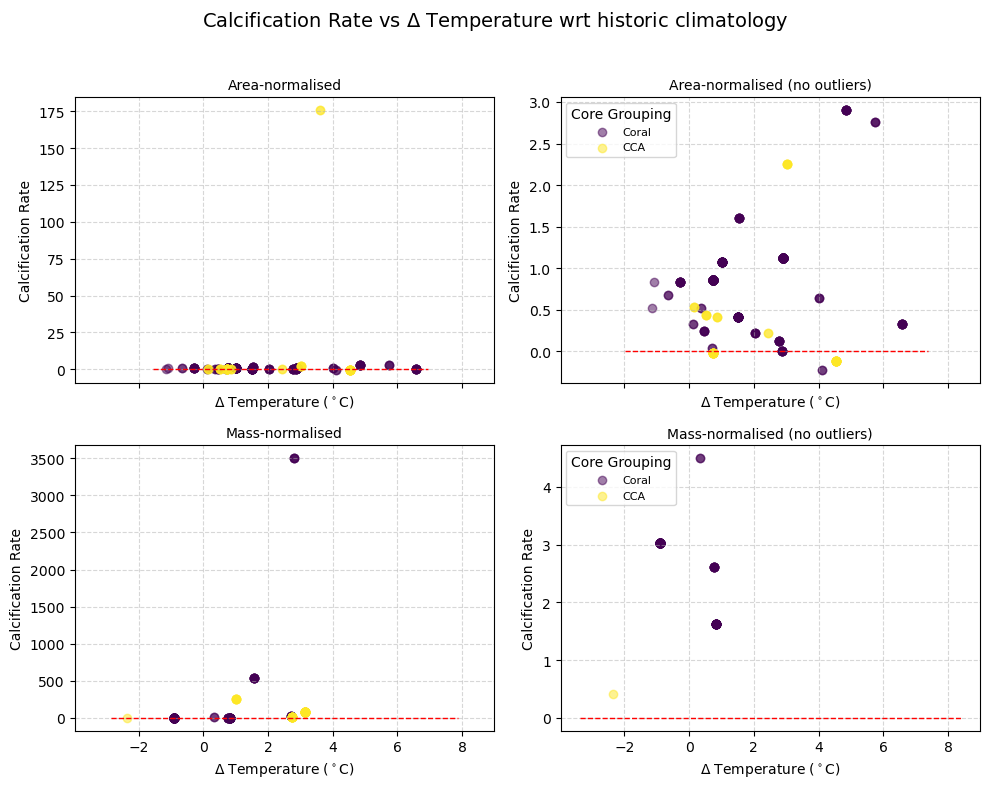

In [104]:
### wrt temperature climatology
fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=True)
group_color_map = {
    group: color
    for group, color in zip(
        area_norm_clim_df["core_grouping"].dropna().unique(),
        plt.cm.viridis(np.linspace(0, 1, area_norm_clim_df["core_grouping"].nunique())),
    )
}

plots = [
    (0, 0, area_norm_clim_df, "Area-normalised"),
    (0, 1, area_norm_clim_no_outliers_df, "Area-normalised (no outliers)"),
    (1, 0, mass_norm_clim_df, "Mass-normalised"),
    (1, 1, mass_norm_clim_no_outliers_df, "Mass-normalised (no outliers)"),
]

for row, col, df, title in plots:
    ax = axes[row][col]
    for group, color in group_color_map.items():
        subset = df[df["core_grouping"] == group]
        ax.scatter(
            subset["delta_t_clim"],
            subset["st_calcification"],
            color=color,
            label=group,
            alpha=0.5,
        )
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("$\\Delta$ Temperature ($^\\circ$C)")
    ax.set_ylabel("Calcification Rate")
    ax.grid(ls="--", alpha=0.5)
    ax.hlines(0, *ax.get_xlim(), color="red", linestyle="--", linewidth=1)
    if col == 1:
        ax.legend(title="Core Grouping", loc="upper left", fontsize=8)

fig.suptitle(
    "Calcification Rate vs $\\Delta$ Temperature wrt historic climatology", fontsize=14
)
fig.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle
plt.show()
